# Innova 2.0 Monobloc Heat Pump Analysis
Created By: Erik Janssen, Analyst, Sustainable Technologies Evaluation Program (STEP)   
Date: 06/07/2022

# 1 Introduction
This notebook outlines the analysis for the performance evaluation of the Innova 2.0 heat pump conducted by STEP at the Archetype Sustainable House Lab in Vaughan, ON. This notebook is a companion to the project report "Real-world  Efficiency of a Monobloc Heat Pump for Multi-Unit Residential Buildings" available at sustainabletechnologies.ca.

# 2 Libraries

In [116]:
# Import libraries - note may not need all...
import requests
import json
import pandas as pd
import xml.etree.ElementTree as ET
from datetime import timedelta
from datetime import datetime
from datetime import timedelta
import glob
from pylab import *
import numpy as np
from scipy.interpolate import griddata
import math
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from IPython.display import Image
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
import matplotlib.dates as mdates
import numpy as np
import matplotlib.dates as mdates
from sklearn.preprocessing import PolynomialFeatures

#Define parameters for visualizing dataframes
pd.set_option('display.max_rows', 1000)

# Define some parameters for plotting
font = {'size'   : 14}
plt.rc('font', **font)
step_blue = "#00a3af"
step_gold = "#f8a81d"
step_green = '#4CAf00'
myFmt1 = mdates.DateFormatter('%m-%d')

# 3 Import Data
Import the data files contained in separate .csv files.

In [2]:
# Get filenames
filenames = glob.glob("./Innova_Final_Clean_Data/*.csv")

# Loop through filenames create a dictionary of dataframes
final_data_dict = {}

for file in filenames:
    df = pd.read_csv(file, parse_dates=['Datetime'])
    df.index = df['Datetime']
    df.drop(['Datetime'], axis=1, inplace = True)
    final_data_dict.update({file[26:]:df}) 

# Look at the filenames
for key in final_data_dict:
    print(key)

0-20mA Airflow - 889184.csv
DP_Indoor_Fan - 803758.csv
Inova Ex RHT - 337455.csv
Inova Sup RHT - 337457.csv
Lights Pulse 64 bit - 338893.csv
Murb- Temp - 775683.csv
New ASHP Pulse Counter 64 bit - 782934.csv
OD_Exhst_TC_grid - 889270.csv
OD_Supp_TC_grid - 889266.csv
Outdoor RHT - 782866.csv
Plugs Pulse 64 bit - 338876.csv
Supply-TC-Grid - 782947.csv


In [3]:
# Put all data together in one dataframe
df_list = []
for key in final_data_dict:
    df_list.append(final_data_dict[key])

for df in df_list:
    df = df.loc[~df.index.duplicated(keep='first')]    

result = pd.concat(df_list, axis=1, sort=True)

# Data is in GMT switch to EST
result.index = [(x + timedelta(hours=-5)) for x in result.index]

# Have a quick look
pd.set_option('display.max_columns', None)
result.tail(5)

# Note -999 is a flag for "no data"

,0-20mA Airflow - 889184Val1,0-20mA Airflow - 889184Val2,0-20mA Airflow - 889184Val3,0-20mA Airflow - 889184Val4,0-20mA Airflow - 889184Val5,0-20mA Airflow - 889184Val6,DP_Indoor_Fan - 803758Val1,DP_Indoor_Fan - 803758Val2,DP_Indoor_Fan - 803758Val3,DP_Indoor_Fan - 803758Val4,DP_Indoor_Fan - 803758Val5,DP_Indoor_Fan - 803758Val6,Inova Ex RHT - 337455Val1,Inova Ex RHT - 337455Val2,Inova Ex RHT - 337455Val3,Inova Ex RHT - 337455Val4,Inova Ex RHT - 337455Val5,Inova Ex RHT - 337455Val6,Inova Sup RHT - 337457Val1,Inova Sup RHT - 337457Val2,Inova Sup RHT - 337457Val3,Inova Sup RHT - 337457Val4,Inova Sup RHT - 337457Val5,Inova Sup RHT - 337457Val6,Lights Pulse 64 bit - 338893Val1,Lights Pulse 64 bit - 338893Val2,Lights Pulse 64 bit - 338893Val3,Lights Pulse 64 bit - 338893Val4,Lights Pulse 64 bit - 338893Val5,Lights Pulse 64 bit - 338893Val6,Murb- Temp - 775683Val1,Murb- Temp - 775683Val2,Murb- Temp - 775683Val3,Murb- Temp - 775683Val4,Murb- Temp - 775683Val5,Murb- Temp - 775683Val6,New ASHP Pulse Counter 64 bit - 782934Val1,New ASHP Pulse Counter 64 bit - 782934Val2,New ASHP Pulse Counter 64 bit - 782934Val3,New ASHP Pulse Counter 64 bit - 782934Val4,New ASHP Pulse Counter 64 bit - 782934Val5,New ASHP Pulse Counter 64 bit - 782934Val6,OD_Exhst_TC_grid - 889270Val1,OD_Exhst_TC_grid - 889270Val2,OD_Exhst_TC_grid - 889270Val3,OD_Exhst_TC_grid - 889270Val4,OD_Exhst_TC_grid - 889270Val5,OD_Exhst_TC_grid - 889270Val6,OD_Supp_TC_grid - 889266Val1,OD_Supp_TC_grid - 889266Val2,OD_Supp_TC_grid - 889266Val3,OD_Supp_TC_grid - 889266Val4,OD_Supp_TC_grid - 889266Val5,OD_Supp_TC_grid - 889266Val6,Outdoor RHT - 782866Val1,Outdoor RHT - 782866Val2,Outdoor RHT - 782866Val3,Outdoor RHT - 782866Val4,Outdoor RHT - 782866Val5,Outdoor RHT - 782866Val6,Plugs Pulse 64 bit - 338876Val1,Plugs Pulse 64 bit - 338876Val2,Plugs Pulse 64 bit - 338876Val3,Plugs Pulse 64 bit - 338876Val4,Plugs Pulse 64 bit - 338876Val5,Plugs Pulse 64 bit - 338876Val6,Supply-TC-Grid - 782947Val1,Supply-TC-Grid - 782947Val2,Supply-TC-Grid - 782947Val3,Supply-TC-Grid - 782947Val4,Supply-TC-Grid - 782947Val5,Supply-TC-Grid - 782947Val6
2022-05-30 18:55:00,4.00,-999.0,-999.0,-999.0,-999.0,-999.0,0.0,26.5,-999.0,-999.0,-999.0,-999.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,813.0,-999.0,-999.0,-999.0,-999.0,-999.0,37.00,26.49,10.6,57.0,26.2,17.1,2453364.0,-999.0,-999.0,-999.0,-999.0,-999.0,28.2,-999.0,-999.0,-999.0,-999.0,-999.0,28.4,-999.0,-999.0,-999.0,-999.0,-999.0,46.11,27.88,15.2,77.3,28.0,19.8,NaN,NaN,NaN,NaN,NaN,NaN,26.6,-999.0,-999.0,-999.0,-999.0,-999.0
2022-05-30 18:56:00,4.00,-999.0,-999.0,-999.0,-999.0,-999.0,0.0,26.4,-999.0,-999.0,-999.0,-999.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,813.0,-999.0,-999.0,-999.0,-999.0,-999.0,37.00,26.50,10.6,57.1,26.2,17.1,2453364.0,-999.0,-999.0,-999.0,-999.0,-999.0,28.1,-999.0,-999.0,-999.0,-999.0,-999.0,28.4,-999.0,-999.0,-999.0,-999.0,-999.0,46.30,27.84,15.3,77.5,28.0,19.8,NaN,NaN,NaN,NaN,NaN,NaN,26.7,-999.0,-999.0,-999.0,-999.0,-999.0
2022-05-30 18:57:00,3.95,-999.0,-999.0,-999.0,-999.0,-999.0,0.0,26.5,-999.0,-999.0,-999.0,-999.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,813.0,-999.0,-999.0,-999.0,-999.0,-999.0,37.02,26.53,10.7,57.2,26.2,17.1,2453364.0,-999.0,-999.0,-999.0,-999.0,-999.0,27.9,-999.0,-999.0,-999.0,-999.0,-999.0,28.3,-999.0,-999.0,-999.0,-999.0,-999.0,46.62,27.86,15.4,78.1,28.0,19.9,NaN,NaN,NaN,NaN,NaN,NaN,26.6,-999.0,-999.0,-999.0,-999.0,-999.0
2022-05-30 18:58:00,4.03,-999.0,-999.0,-999.0,-999.0,-999.0,0.0,26.5,-999.0,-999.0,-999.0,-999.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,813.0,-999.0,-999.0,-999.0,-999.0,-999.0,36.96,26.53,10.6,57.1,26.2,17.1,2453364.0,-999.0,-999.0,-999.0,-999.0,-999.0,28.3,-999.0,-999.0,-999.0,-999.0,-999.0,28.1,-999.0,-999.0,-999.0,-999.0,-999.0,47.02,27.76,15.4,78.3,27.9,19.9,NaN,NaN,NaN,NaN,NaN,NaN,26.6,-999.0,-999.0,-999.0,-999.0,-999.0
2022-05-30 18:59:00,3.97,-999.0,-999.0,-999.0,-999.0,-999.0,0.0,26.5,-999.0,-999.0,-999.0,-999.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

The data from each individual datafile has now been imported and added to a single dataframe.

# 4 Organize Data 
We don't need everything in the dataframe so we will create a summary dataframe that contains the important parts. The instrumentation is discussed further in a companion document available alongside this notebook in the github repository.

In [4]:
# Create summary dataframe
summary_df = result[['Lights Pulse 64 bit - 338893Val1', # Energy pulse counter for lights 
                    'Murb- Temp - 775683Val1', # Indoor relative humidity
                    'Murb- Temp - 775683Val2', # Indoor dry bulb temperature
                    'New ASHP Pulse Counter 64 bit - 782934Val1', # Energy pulse counter for ASHP & baseboards
                    'Outdoor RHT - 782866Val2', # Outdoor relative humidity
                    'Outdoor RHT - 782866Val1', # Outdoor dry bulb temperature
                    'Supply-TC-Grid - 782947Val1', # Indoor supply thermocouple grid
                    '0-20mA Airflow - 889184Val1', # 0-20 mA differential pressure transducer attached to airflow station
                    'OD_Exhst_TC_grid - 889270Val1', # Themocouple grid on outdoors Exhaust
                    'OD_Supp_TC_grid - 889266Val1', # Thermocouple grid on outdooos Intake
                    'DP_Indoor_Fan - 803758Val1', # Differential pressure on indoor fan (used to determine when fan was on)
                    ]]
summary_df.tail()

,Lights Pulse 64 bit - 338893Val1,Murb- Temp - 775683Val1,Murb- Temp - 775683Val2,New ASHP Pulse Counter 64 bit - 782934Val1,Outdoor RHT - 782866Val2,Outdoor RHT - 782866Val1,Supply-TC-Grid - 782947Val1,0-20mA Airflow - 889184Val1,OD_Exhst_TC_grid - 889270Val1,OD_Supp_TC_grid - 889266Val1,DP_Indoor_Fan - 803758Val1
2022-05-30 18:55:00,813.0,37.00,26.49,2453364.0,27.88,46.11,26.6,4.00,28.2,28.4,0.0
2022-05-30 18:56:00,813.0,37.00,26.50,2453364.0,27.84,46.30,26.7,4.00,28.1,28.4,0.0
2022-05-30 18:57:00,813.0,37.02,26.53,2453364.0,27.86,46.62,26.6,3.95,27.9,28.3,0.0
2022-05-30 18:58:00,813.0,36.96,26.53,2453364.0,27.76,47.02,26.6,4.03,28.3,28.1,0.0
2022-05-30 18:59:00,813.0,36.99,26.53,2453364.0,27.80,46.21,26.7,3.97,28.4,28.4,0.0


It's helpful to have easier columns names. So rename them.

In [5]:
# Dictionary to rename columns
rename_dict = {
               'Lights Pulse 64 bit - 338893Val1':'Lights_Pulse',
               'Murb- Temp - 775683Val2': 'Indoor_Temp',
               'Murb- Temp - 775683Val1': 'Indoor_RH',
               'New ASHP Pulse Counter 64 bit - 782934Val1': 'ASHP_Pulse',
               'Outdoor RHT - 782866Val2':'Outdoor_Temp',
               'Supply-TC-Grid - 782947Val1':'Supply_Temp',
               '0-20mA Airflow - 889184Val1': 'Airflow_4_20',
               'OD_Exhst_TC_grid - 889270Val1':'OD_Exhaust',
               'OD_Supp_TC_grid - 889266Val1':'OD_Intake',
               'Outdoor RHT - 782866Val1':'OD_RH',   
               'DP_Indoor_Fan - 803758Val1':"DP_Indoor_Fan"
              }

# Rename
summary = summary_df.rename(columns=rename_dict,inplace=False)
summary = summary[:-60]
summary.tail()

,Lights_Pulse,Indoor_RH,Indoor_Temp,ASHP_Pulse,Outdoor_Temp,OD_RH,Supply_Temp,Airflow_4_20,OD_Exhaust,OD_Intake,DP_Indoor_Fan
2022-05-30 17:55:00,813.0,37.14,26.31,2453361.0,29.03,40.82,26.5,4.01,29.5,29.8,0.0
2022-05-30 17:56:00,813.0,37.08,26.32,2453361.0,29.01,40.85,26.6,4.00,29.5,29.8,0.0
2022-05-30 17:57:00,813.0,37.11,26.32,2453361.0,29.00,41.94,26.7,4.01,29.3,29.5,0.0
2022-05-30 17:58:00,813.0,37.10,26.34,2453361.0,28.94,41.97,26.4,4.00,29.5,29.7,0.0
2022-05-30 17:59:00,813.0,37.09,26.35,2453361.0,28.96,42.40,26.5,3.99,29.1,30.0,0.0


Have a quick visual inspection of the data by plotting each column.

C:\ProgramData\Anaconda3\lib\site-packages\pandas\plotting\_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


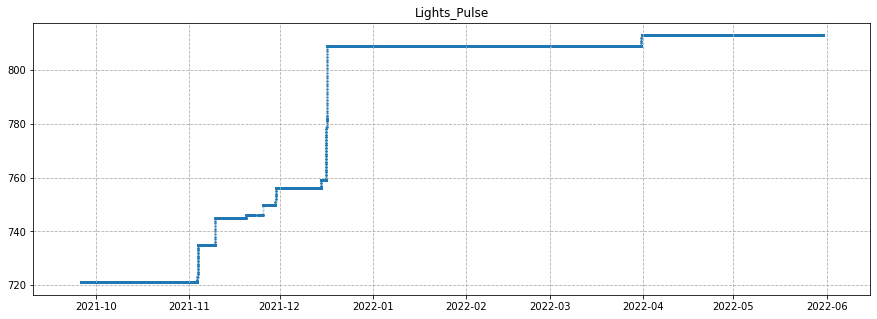

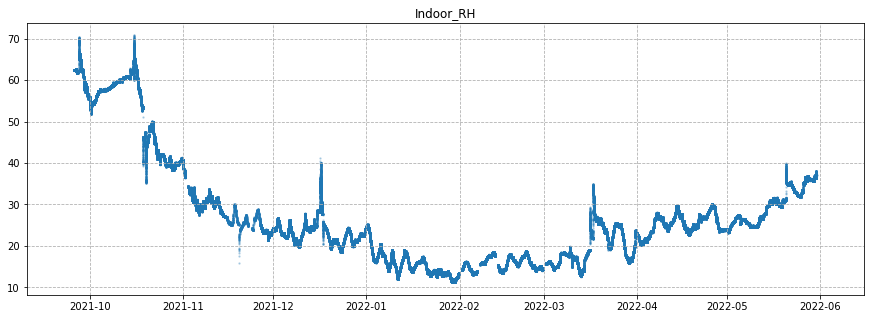

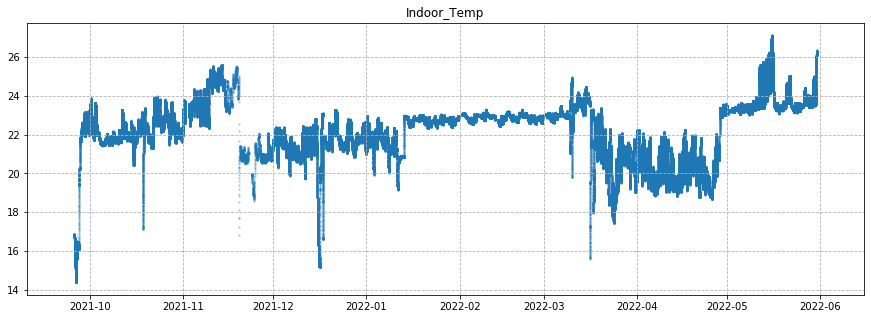

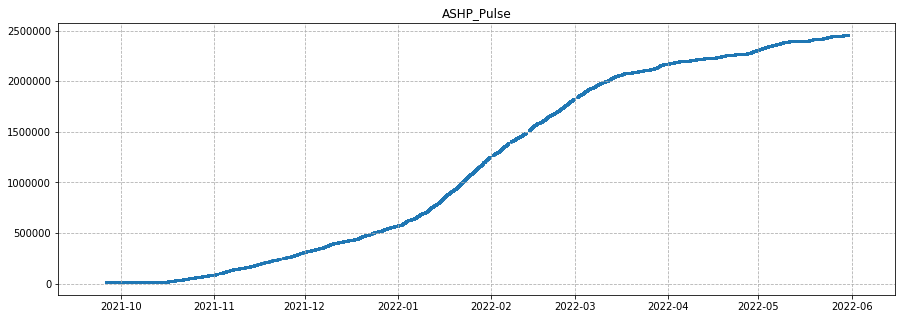

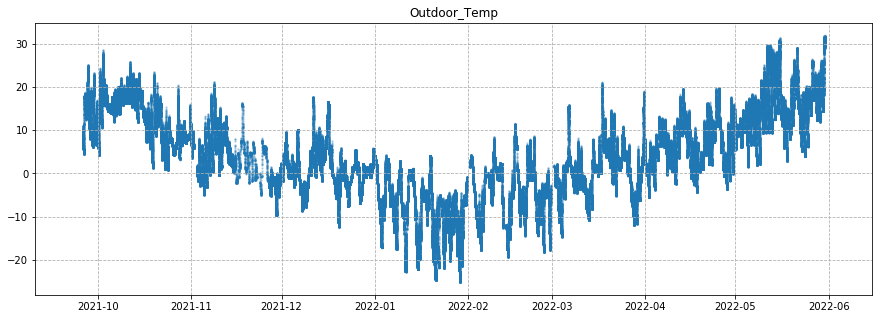

...

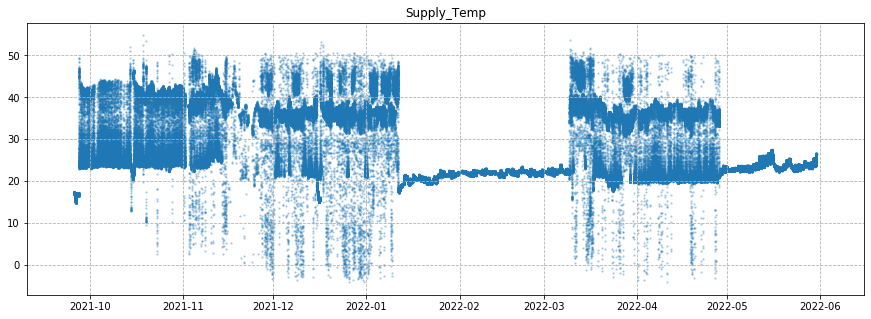

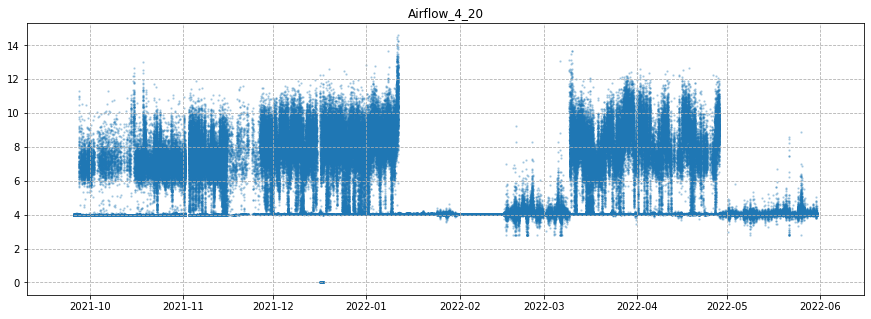

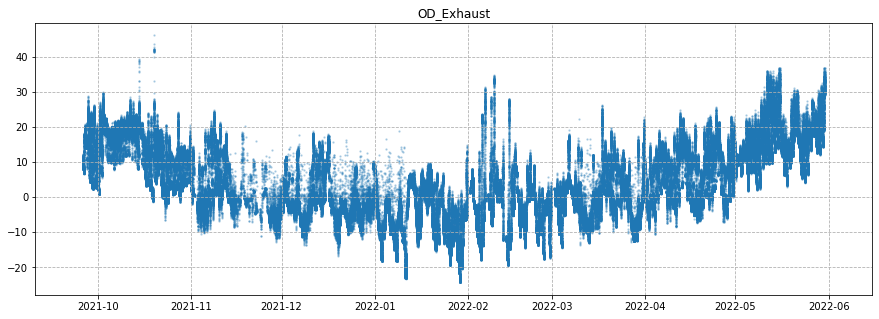

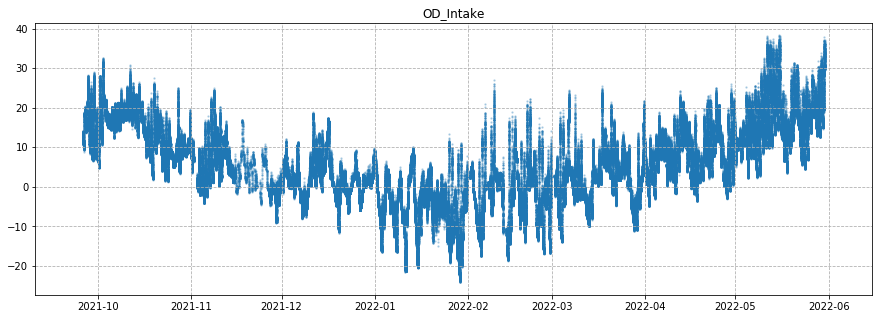

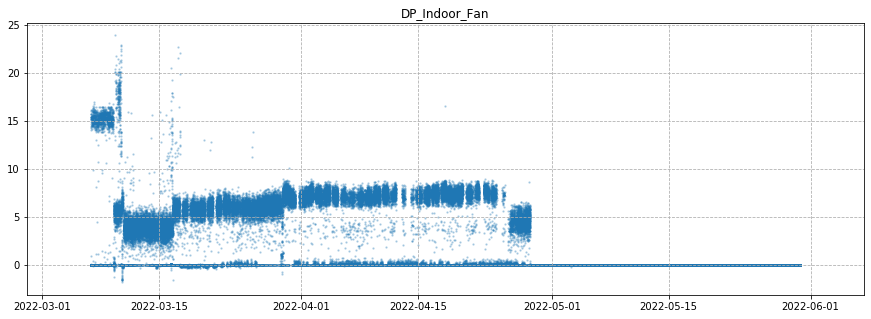

In [6]:
# Have a quick visual inspection of the data
for col in summary.columns:
    plt.figure(figsize = (15,5))
    plt.grid(ls='--')
    plt.title(col)
    plt.scatter(summary.index,summary[col],s=2,alpha = 0.25)
    plt.show()

Note that "DP_Indoor_Fan" was not installed for the full monitoring period.

Check for missing data.

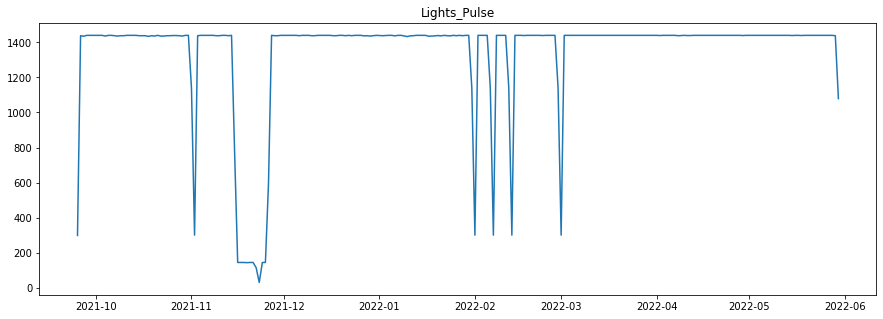

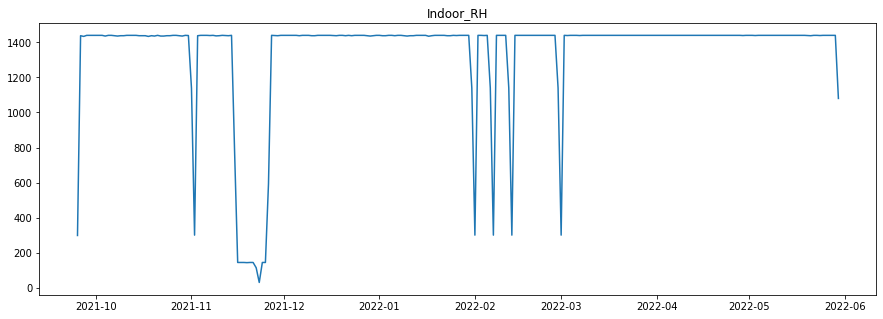

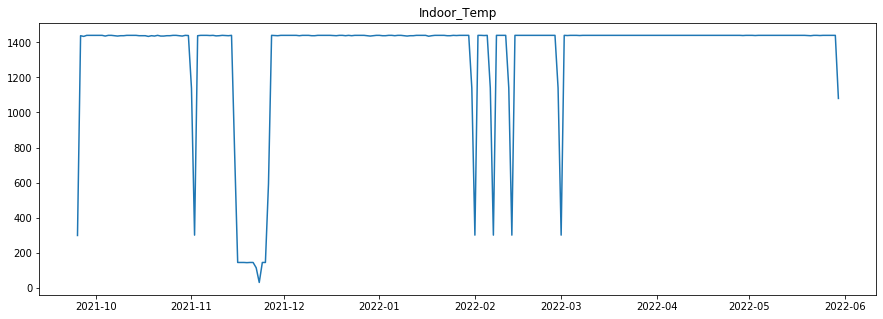

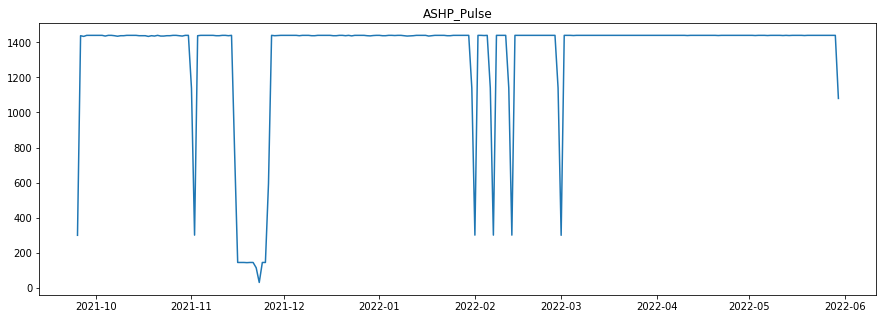

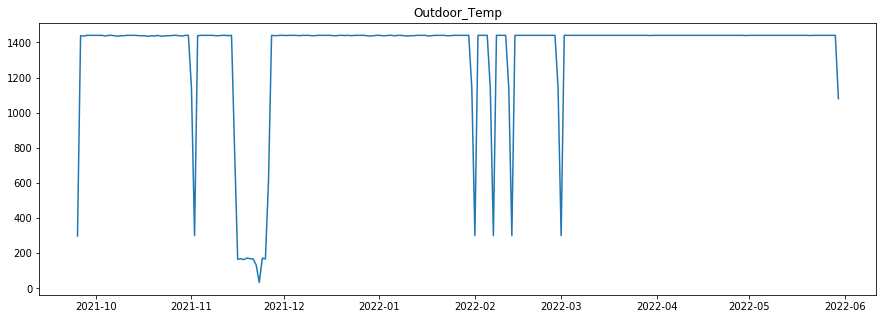

...

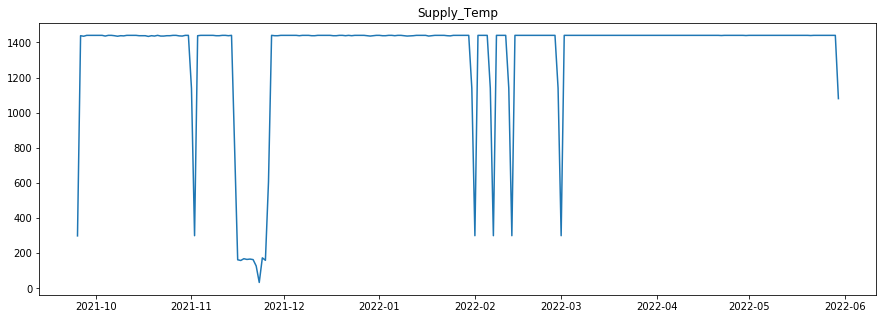

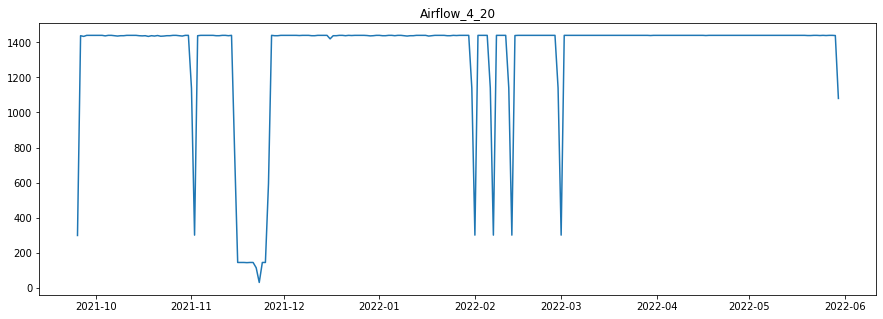

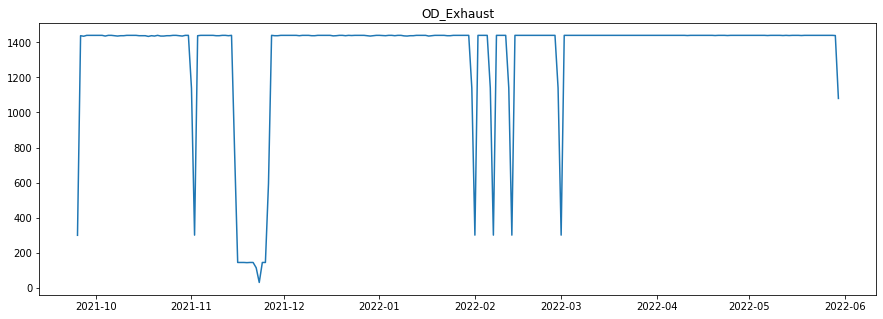

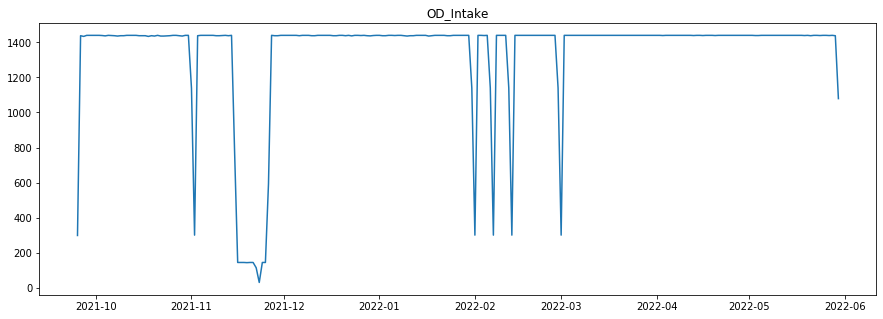

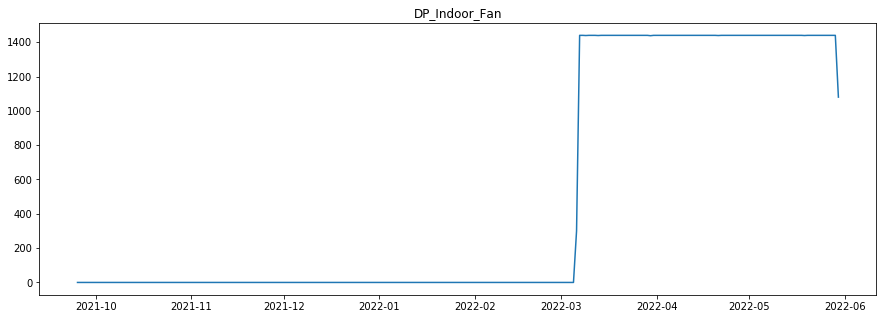

In [7]:
data_missing = summary.resample('1D').count()
for col in summary.columns:
    plt.figure(figsize = (15,5))
    plt.plot(data_missing.index, data_missing[col])
    plt.title(col)
    plt.show()

In [8]:
data_missing

,Lights_Pulse,Indoor_RH,Indoor_Temp,ASHP_Pulse,Outdoor_Temp,OD_RH,Supply_Temp,Airflow_4_20,OD_Exhaust,OD_Intake,DP_Indoor_Fan
2021-09-25,298,298,298,299,298,298,299,298,299,298,0
2021-09-26,1438,1438,1438,1438,1438,1438,1438,1438,1438,1438,0
2021-09-27,1435,1434,1434,1434,1436,1436,1435,1434,1435,1434,0
2021-09-28,1440,1440,1440,1440,1440,1440,1440,1440,1440,1440,0
2021-09-29,1440,1440,1440,1440,1440,1440,1440,1440,1440,1440,0
2021-09-30,1440,1440,1440,1440,1440,1440,1440,1440,1440,1440,0
2021-10-01,1440,1440,1440,1440,1440,1440,1440,1440,1440,1440,0
2021-10-02,1440,1440,1440,1440,1440,1440,1440,1440,1440,1440,0
2021-10-03,1440,1440,1440,1440,1440,1440,1440,1440,1440,1439,0
2021-10-04,1436,1436,1436,1436,1436,1436,1436,1437,1436,1437,0


Missing data is the same across all sensor except for indoor differential pressure (which was installed late). I'm going to find all the days with greater than 2% data loss and leave it out of the analysis. 

In [9]:
data_missing['data_loss_frac'] = (1440 - data_missing.Supply_Temp)/1440 
missing_indices = []
for missing,index in zip(data_missing.data_loss_frac,data_missing.index):
    if missing > 0.005:
        missing_indices.append(index.date())
missing_indices

[datetime.date(2021, 9, 25),
 datetime.date(2021, 11, 1),
 datetime.date(2021, 11, 2),
 datetime.date(2021, 11, 15),
 datetime.date(2021, 11, 16),
 datetime.date(2021, 11, 17),
 datetime.date(2021, 11, 18),
 datetime.date(2021, 11, 19),
 datetime.date(2021, 11, 20),
 datetime.date(2021, 11, 21),
 datetime.date(2021, 11, 22),
 datetime.date(2021, 11, 23),
 datetime.date(2021, 11, 24),
 datetime.date(2021, 11, 25),
 datetime.date(2021, 11, 26),
 datetime.date(2022, 1, 31),
 datetime.date(2022, 2, 1),
 datetime.date(2022, 2, 6),
 datetime.date(2022, 2, 7),
 datetime.date(2022, 2, 12),
 datetime.date(2022, 2, 13),
 datetime.date(2022, 2, 28),
 datetime.date(2022, 3, 1),
 datetime.date(2022, 5, 30)]

In [10]:
# Check if each timestamp is from a day when there was missing data
summary['date'] = [x.date() for x in summary.index]
def check_missing(dt):
    bad_date = False
    for date in missing_indices:
        if dt == date:
            bad_date = True
    return bad_date
summary['bad_date'] = [check_missing(x) for x in summary.date]
summary

,Lights_Pulse,Indoor_RH,Indoor_Temp,ASHP_Pulse,Outdoor_Temp,OD_RH,Supply_Temp,Airflow_4_20,OD_Exhaust,OD_Intake,DP_Indoor_Fan,date,bad_date
2021-09-25 19:00:00,721.0,62.41,16.84,12709.0,11.01,89.94,17.1,4.01,12.2,13.7,NaN,2021-09-25,True
2021-09-25 19:01:00,721.0,62.45,16.84,12709.0,10.98,90.01,17.3,4.01,12.0,13.9,NaN,2021-09-25,True
2021-09-25 19:02:00,721.0,62.46,16.84,12709.0,10.97,90.06,17.2,4.01,12.0,13.8,NaN,2021-09-25,True
2021-09-25 19:03:00,721.0,62.43,16.84,12709.0,10.97,90.12,17.3,4.01,11.7,13.6,NaN,2021-09-25,True
2021-09-25 19:04:00,721.0,62.44,16.85,12709.0,10.93,90.12,17.3,4.01,12.2,13.8,NaN,2021-09-25,True
2021-09-25 19:05:00,721.0,62.46,16.85,12709.0,10.91,90.15,17.3,4.01,11.9,14.0,NaN,2021-09-25,True
2021-09-25 19:06:00,721.0,62.46,16.84,12710.0,10.88,90.13,17.3,4.01,11.8,13.8,NaN,2021-09-25,True
2021-09-25 19:07:00,721.0,62.48,16.85,12710.0,10.86,90.14,17.3,4.01,11.8,13.8,NaN,2021-09-25,True
2021-09-25 19:08:00,721.0,62.45,16.87,12710.0,10.83,90.11,17.2,4.01,12.0,13.8,NaN,2021-09-25,True
2021-09-25 19:09:00,721.0,62.46,16.84,12710.0,10.77,90.12,17.1,4.01,12.0,13.6,NaN,2021-09-25,True


In [11]:
# Drop data from days with missing data
indices_to_drop = []
for missing,index in zip(summary.bad_date,summary.index):
    if missing == True:
        indices_to_drop.append(index)
summary.drop(indices_to_drop, inplace = True)

## 5 Calculated Parameters
Will need to use the raw data to calculate other parameters - chiefly COP and capacity.

In [12]:
# Function to turn totalized pulses to pulse numbers
def pulse_convert(totalized_pulses):
    totalized_pulses_offset = [totalized_pulses[0]] + totalized_pulses[:-1]
    pulses = np.array(totalized_pulses) - np.array(totalized_pulses_offset)
    return pulses

In [13]:
# Define Constants
water_density = 999.2 # Density of water in units kg/m3
air_Cp = 1.006 # Specific heat capacity of dry air at constant pressure in units kJ/(kg K)
water_vap_Cp = 1.871 # Specific heat capacity of water vapout at constant pressure in units kJ/(kg K)
R_a = 286.9 # The individual gas constant for air in units J/(kg K)
R_w = 461.5 # The individual gas constant for water vapour in units J/(kg K)

In [14]:
def air_params(T_a,p_a,RH):
    '''
    This function determine the humidity ratio (w) in units kg/kg and air density (air_dens) in units kg/m3 of air given the inputs for
    air temperature (T_a) in units Celsius, ambient pressure (p_a) in units kPa, and relative humidity (RH) as a fraction.
    
    '''
    RH=RH/100
    
    #Calculate the saturation pressure of water vapour    
    p_ws = 7.097*10**(-5)*T_a**3-1.606*10**(-5)*T_a**2+5.385*10**(-2)*T_a+7.193*10**(-1)
    
    #Calculate the correction factor for relative humidity
    C = 0.01*p_a-0.013
    
    # Calculate the partial pressure of water vapour 
    p_w = (RH*p_ws)/C
       
    # Calculate the humidity ratio
    w = 0.6220*p_w/(p_a-p_w)
        
    # Calculate the air density
    kgpm3_to_lbpft3 = 0.06243
    air_dens_met = (p_a*10**3/(R_a*(T_a+273.15)))*((1+w))/((1+w*(R_w/R_a)))
    air_dens_imp = air_dens_met *  kgpm3_to_lbpft3
    
    return {'dens_imp': air_dens_imp, 'w': w, 'dens_met':air_dens_met} 

# Test on standard air should be 0.075 lb/ft3
air_params(20,101.3,0.50)['dens_imp']

0.07519053979202231

In [15]:
#Import pressure data collected from weatherstats.ca
pressure = pd.read_csv('pressure_06_07_2022.csv',parse_dates = ['date_time_local'])
pressure.index = pressure['date_time_local']
pressure.drop(['date_time_local'], axis=1, inplace = True)

#Interpolate hourly pressure data file to 1 min timescale
pressure = pressure.resample('1T').mean().interpolate()
pressure.columns = ['air_pressure_kPa']
pressure.head()

,air_pressure_kPa
date_time_local,
2021-06-07 13:00:00,99.460000
2021-06-07 13:01:00,99.459333
2021-06-07 13:02:00,99.458667
2021-06-07 13:03:00,99.458000
2021-06-07 13:04:00,99.457333


In [16]:
# Function to apply the correct pulse conversion factor
def pulse_factor_ASHP(date):
    '''
    The conversion factor for the energy meter pulses changed on October 15th.
    Need a function to apply the right factor depending on the datastamp of the data.
    '''
    if date < datetime.datetime.strptime('10/15/2021 13:18','%m/%d/%Y %H:%M'):
        pulse_factor = (1/250)
    else:
        pulse_factor = (1/1000)
    return pulse_factor

pulse_factor_lights = (1/250)

Transform the totalized pulses from the pulse counters to number of pulses, and then kWh.

In [17]:
# Calculated parameters
summary['ASHP_Pulse_num'] = pulse_convert(summary.ASHP_Pulse.to_list())
summary['Lights_Pulse_num'] = pulse_convert(summary.Lights_Pulse.to_list())
summary['ASHP_Pulse_kWh'] = [x*pulse_factor_ASHP(y) for x,y in zip(summary.ASHP_Pulse_num,summary.index)]
summary['Lights_Pulse_kWh'] = [x*pulse_factor_lights for x in summary.Lights_Pulse_num]

Calculate the airflow using the conversions from the differential pressure sensor and flow station. A 4 to 20 mA output from the pressure transducer is logged. 4mA is 0 in. wc. and 20 mA is 0.4 in. wc. The slope of the calibration line is then (0.5 in. wc)/(16 mA). The equation provided with the flow station was 500 * (differential pressure in. wc) ^ (1/2).


In [18]:
summary['Airflow_cfm'] = 500*(((summary.Airflow_4_20-3.99)/16)*0.5)**0.5 # Conversion from Nailor flow station
summary['Airflow_cfm'] = [x if (x>20) else 0 for x in summary.Airflow_cfm]
summary['Airflow_m3_s'] = summary.Airflow_cfm/2118 

When the baseboards were operating the extended duct from the measurement set-up with the flowstation was removed and left outside in opern air. Wind could blow freely through and thus, we see some airflow measured while the baseboards were operating. Just want to set airflow to zero when baseboards were operating so it doesn't impact the calculations.

In [19]:
def which_equipment(date):
    equip = 'null'
    if date < datetime.datetime.strptime('01/11/2022', '%m/%d/%Y'):
        equip = 'HP'
    elif (date > datetime.datetime.strptime('01/12/2022', '%m/%d/%Y')) & (date < datetime.datetime.strptime('03/09/2022', '%m/%d/%Y')):
        equip = 'BB'
    elif (date > datetime.datetime.strptime('03/09/2022', '%m/%d/%Y')) & (date < datetime.datetime.strptime('04/28/2022', '%m/%d/%Y')):
        equip = 'HP'
    elif date > datetime.datetime.strptime('04/29/2022', '%m/%d/%Y'):
        equip = 'BB'
    else:
        equip = 'null'
    return equip

summary['Equipment'] = [which_equipment(x) for  x in summary.index]
summary['Airflow_cfm'] = [x if (y == 'HP') else 0 for x,y in zip(summary.Airflow_cfm,summary.Equipment)]
summary['Airflow_m3_s'] = [x if (y == 'HP') else 0 for x,y in zip(summary.Airflow_m3_s,summary.Equipment)]

To calculate capacity will need to take into account pressure and moisture impacts on specific heat capacity and density.

In [20]:
# Need to take into account pressure and mositure impacts on density and specific heat capacity
summary = summary.join(pressure)

# Calculate Heat Removed From Outdoor Air
summary['OD_air_density_kgm3'] = [air_params(a,b,c)['dens_met'] for a,b,c in zip(summary.Outdoor_Temp,summary.air_pressure_kPa,summary.OD_RH)]
summary['OD_humidity_ratio'] = [air_params(a,b,c)['w'] for a,b,c in zip(summary.Outdoor_Temp,summary.air_pressure_kPa,summary.OD_RH)]
summary['Capacity_kW'] = [a*b*(air_Cp + c*water_vap_Cp)*(d - e) for a,b,c,d,e in zip(summary.Airflow_m3_s, #From OD_Air
                                                                               summary.OD_air_density_kgm3,
                                                                               summary.OD_humidity_ratio,
                                                                               summary.OD_Intake,
                                                                               summary.OD_Exhaust)]

Calculate a few more parameters.

In [21]:
summary['ASHP_kW'] = summary.ASHP_Pulse_kWh * 60 # Recall - it's minutes level data
summary['Total_Capacity_kW'] = summary.Capacity_kW + summary.ASHP_kW # Electrical consumption ends up as heat on inside of suite
summary['COP'] = summary.Total_Capacity_kW/summary.ASHP_kW # This should NOT be aggregated to estimate COP at other time scales


It's helpful to calculate other parameters to better understand equipment cycling.

In [22]:
# Want to know when heat pump is on
summary['ON'] = [1 if x > 0.05 else 0 for x in summary.Capacity_kW] # get a "1" if heat pump is on

# Want to know when heat pump turned on
offset_ON = [0] + summary.ON.to_list()[:-1]
Turned_ON = []
for x,y in zip(offset_ON,summary.ON.to_list()):
    a = 0
    if y > x:
        a = 1
    Turned_ON.append(a)
summary['Turned_ON'] = Turned_ON # get a "1" for timestamps where the heat pump turned on

# Consider only those pulses where the heat pump is on - i.e. neglect the fan power consumption when there is no heating
summary['Corr_ASHP_Pulse_num'] = [0 if (x < 0.05) else y for x,y in zip(summary.Capacity_kW,summary.ASHP_Pulse_num)]
summary['Corr_ASHP_Pulse_kWh'] = [0 if (x < 0.05) else y for x,y in zip(summary.Capacity_kW,summary.ASHP_Pulse_kWh)]
summary['Corr_ASHP_Pulse_kW'] = summary['Corr_ASHP_Pulse_kWh']*60

summary.tail()

,Lights_Pulse,Indoor_RH,Indoor_Temp,ASHP_Pulse,Outdoor_Temp,OD_RH,Supply_Temp,Airflow_4_20,OD_Exhaust,OD_Intake,DP_Indoor_Fan,date,bad_date,ASHP_Pulse_num,Lights_Pulse_num,ASHP_Pulse_kWh,Lights_Pulse_kWh,Airflow_cfm,Airflow_m3_s,Equipment,air_pressure_kPa,OD_air_density_kgm3,OD_humidity_ratio,Capacity_kW,ASHP_kW,Total_Capacity_kW,COP,ON,Turned_ON,Corr_ASHP_Pulse_num,Corr_ASHP_Pulse_kWh,Corr_ASHP_Pulse_kW
2022-05-29 23:55:00,813.0,36.36,24.45,2452779.0,16.37,74.69,24.6,4.01,16.4,16.7,0.0,2022-05-29,False,0.0,0.0,0.0,0.0,0.0,0.0,BB,99.578333,1.192217,0.009191,0.0,0.0,0.0,NaN,0,0,0.0,0.0,0.0
2022-05-29 23:56:00,813.0,36.40,24.44,2452779.0,16.40,74.80,24.9,4.01,16.1,16.5,0.0,2022-05-29,False,0.0,0.0,0.0,0.0,0.0,0.0,BB,99.578667,1.192077,0.009221,0.0,0.0,0.0,NaN,0,0,0.0,0.0,0.0
2022-05-29 23:57:00,813.0,36.35,24.44,2452779.0,16.35,75.01,24.9,4.01,16.1,16.6,0.0,2022-05-29,False,0.0,0.0,0.0,0.0,0.0,0.0,BB,99.579000,1.192287,0.009220,0.0,0.0,0.0,NaN,0,0,0.0,0.0,0.0
2022-05-29 23:58:00,813.0,36.35,24.45,2452779.0,16.28,75.30,24.7,4.01,16.2,16.3,0.0,2022-05-29,False,0.0,0.0,0.0,0.0,0.0,0.0,BB,99.579333,1.192581,0.009218,0.0,0.0,0.0,NaN,0,0,0.0,0.0,0.0
2022-05-29 23:59:00,813.0,36.35,24.45,2452779.0,16.26,75.61,24.8,4.01,16.0,16.3,0.0,2022-05-29,False,0.0,0.0,0.0,0.0,0.0,0.0,BB,99.579667,1.192648,0.009245,0.0,0.0,0.0,NaN,0,0,0.0,0.0,0.0


Let's plot some time series data to better understand what is happening during a defrost. We assumed that during a defrost the outdoor blower would turn off, and the indoor blower would remain on at low speed. To estimate the heat lost from the room during a defrost we would then need to know the indoor airflow.

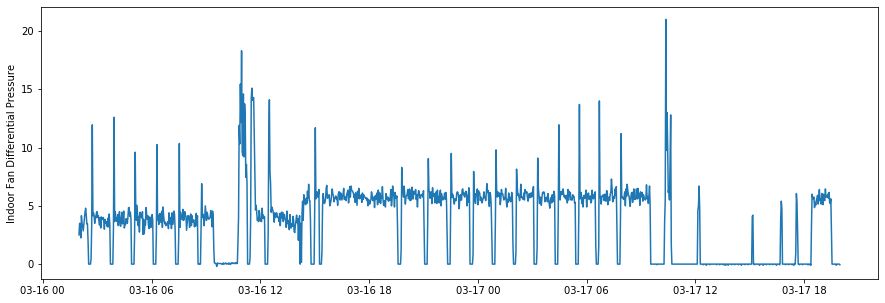

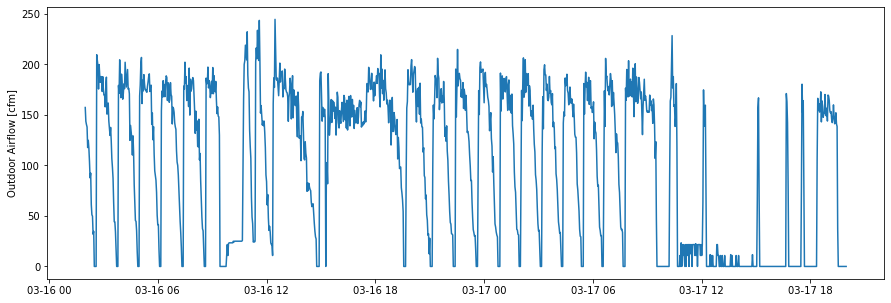

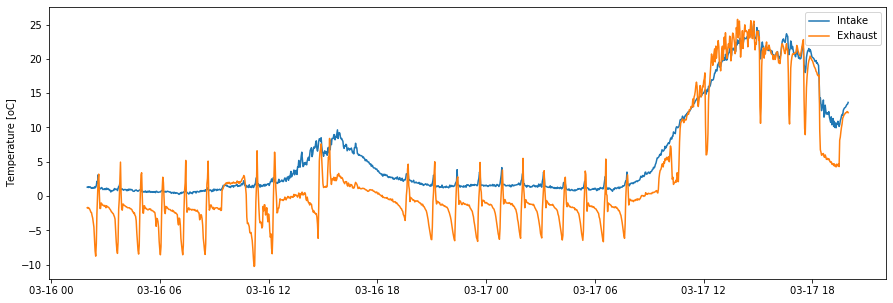

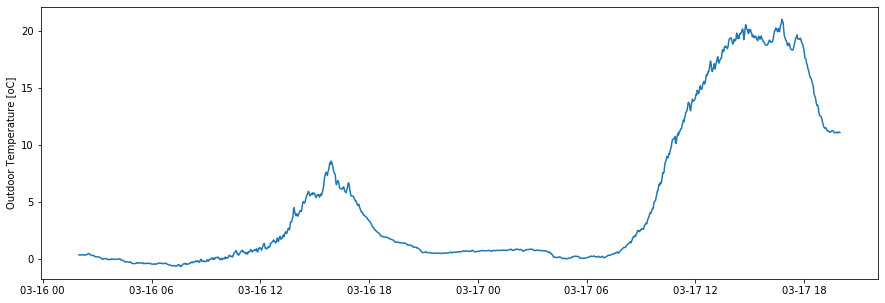

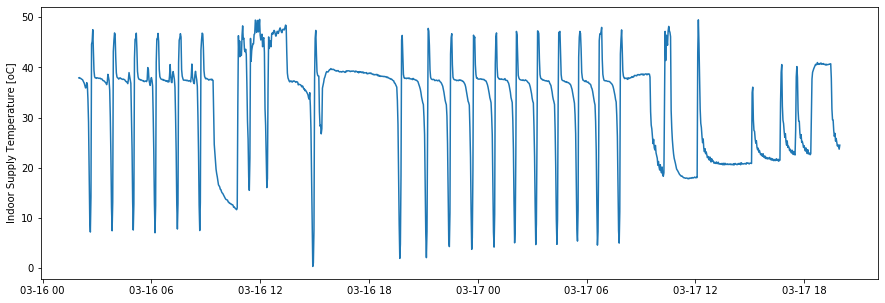

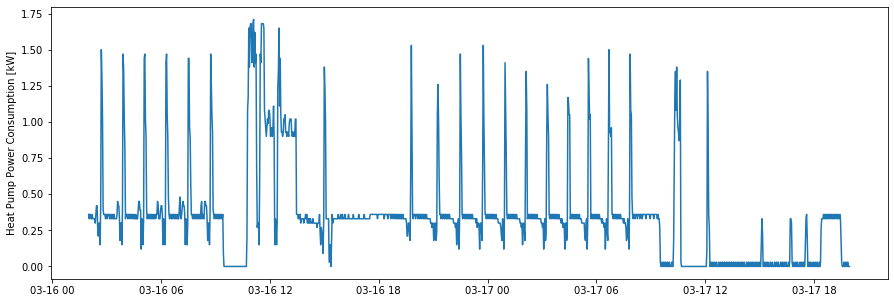

In [23]:
# Time series plots 

# Pick a day
strt_date = datetime.datetime.strptime('03/16/2022 02', '%m/%d/%Y %H')
end_date = datetime.datetime.strptime('03/17/2022 20', '%m/%d/%Y %H')
plot_df = summary.loc[(summary.index > strt_date)&(summary.index < end_date)]
plot_df = plot_df.resample('2min').mean()

plt.figure(figsize = (15,5))
plt.ylabel('Indoor Fan Differential Pressure')
plt.plot(plot_df.index,plot_df.DP_Indoor_Fan)

plt.figure(figsize = (15,5))
plt.ylabel('Outdoor Airflow [cfm]')
plt.plot(plot_df.index,plot_df.Airflow_cfm)

plt.figure(figsize = (15,5))
plt.ylabel('Temperature [oC]')
plt.plot(plot_df.index,plot_df.OD_Intake, label = 'Intake')
plt.plot(plot_df.index,plot_df.OD_Exhaust, label = 'Exhaust')
plt.legend()

plt.figure(figsize = (15,5))
plt.ylabel('Outdoor Temperature [oC]')
plt.plot(plot_df.index,plot_df.Outdoor_Temp)

plt.figure(figsize = (15,5))
plt.ylabel('Indoor Supply Temperature [oC]')
plt.plot(plot_df.index,plot_df.Supply_Temp)

plt.figure(figsize = (15,5))
plt.ylabel('Heat Pump Power Consumption [kW]')
plt.plot(plot_df.index,plot_df.ASHP_kW)

During this period of time we see defrosts and we see the unit turn right off. You can tell when it turns off because the power consumption goes to zero and the supply temperature decays to room temperature. You can tell when it defrosts because the supply temperature gets very low, while the power also goes low (but not zero). When it defrosts, the differential pressure reading on the indoor fan coil goes to zero. There is no airflow on the outside or the inside during a defrost. We can't take defrost into account using airflow measurements. But we can take it into account using the "Energy Comparison" method described in the companion technical brief.

Plot some calculated parameters as a time series.

Text(0, 0.5, 'Heating Capacity (kW)')

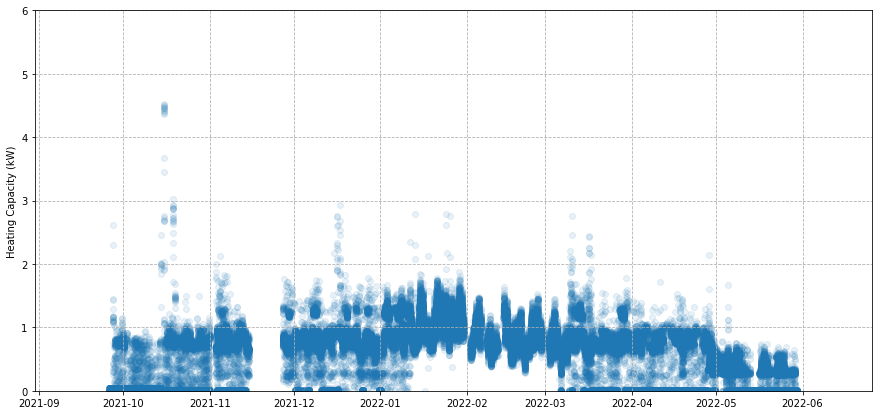

In [24]:
# Plot total capacity
plt.figure(figsize = (15,7))
plt.scatter(summary.resample('5min').mean().index,summary.resample('5min').mean().Total_Capacity_kW, alpha = 0.1)
plt.grid(ls='--')
plt.ylim(0,6)
plt.ylabel('Heating Capacity (kW)')

Text(0, 0.5, 'COP')

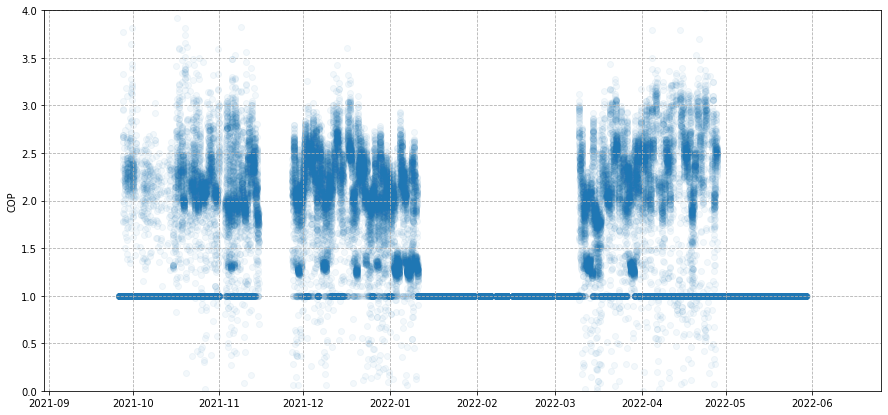

In [25]:
# Plot COP
plt.figure(figsize = (15,7))
plt.scatter(summary.resample('5min').mean().index,summary.resample('5min').mean().COP,alpha = 0.05)
plt.ylim(0,4)
plt.grid(ls='--')
plt.ylabel('COP')

Calculated parameters are complete.

# 6 Daily Aggregation
Want to summarize daily average temperature, ASHP_kWh, and max supply temp..

In [26]:
# Make a daily summary dataframe
summary_daily_df = pd.DataFrame({
    'Mean_OD_Temp': summary.resample('1D').mean()['Outdoor_Temp'],
    'Mean_ID_Temp': summary.resample('1D').mean()['Indoor_Temp'],
    'Max_Indoor_Temp': summary.resample('1D').max()['Indoor_Temp'], 
    'Min_Indoor_Temp': summary.resample('1D').min()['Indoor_Temp'], 
    'ASHP_Pulse_kWh': (summary.resample('1D').max()['ASHP_Pulse'] - summary.resample('1D').min()['ASHP_Pulse']),
    'Max_Supply': summary.resample('1D').max()['Supply_Temp'], 
    'HP_Heat_Delivered_kWh': summary.resample('1D').sum()['Total_Capacity_kW']/60
})
summary_daily_df['ASHP_Pulse_kWh'] = [x*pulse_factor_ASHP(y) for x,y in zip(summary_daily_df.ASHP_Pulse_kWh,summary_daily_df.index)]
summary_daily_df['Temp_diff'] = summary_daily_df['Mean_ID_Temp'] - summary_daily_df['Mean_OD_Temp'] 

In [27]:
summary_daily_df

,Mean_OD_Temp,Mean_ID_Temp,Max_Indoor_Temp,Min_Indoor_Temp,ASHP_Pulse_kWh,Max_Supply,HP_Heat_Delivered_kWh,Temp_diff
2021-09-26,12.305090,15.653908,16.50,14.38,0.420,17.2,0.420238,3.348818
2021-09-27,17.582716,19.230070,21.84,16.09,1.468,49.5,3.044951,1.647354
2021-09-28,12.013840,22.270174,22.98,21.67,2.304,43.3,4.780434,10.256333
2021-09-29,13.077236,22.525861,23.18,21.91,2.216,42.3,4.558014,9.448625
2021-09-30,11.421556,22.309153,23.21,21.96,2.680,42.8,6.081909,10.887597
2021-10-01,12.723382,22.729528,23.89,22.05,2.364,42.8,4.789884,10.006146
2021-10-02,18.900590,22.577729,23.65,21.71,1.048,43.1,2.078141,3.677139
2021-10-03,17.499611,22.222361,23.18,21.89,0.548,43.6,0.831313,4.722750
2021-10-04,15.042869,21.657187,21.99,21.45,1.444,44.3,2.655962,6.614318
2021-10-05,15.578146,21.542958,21.65,21.43,1.504,44.2,2.817065,5.964812


In [28]:
# Delete any dates where there was known activity in the MURB suite

Delete_dates = [
    datetime.datetime.strptime('09/25/2021', '%m/%d/%Y'), # Working on equipment
    datetime.datetime.strptime('09/26/2021', '%m/%d/%Y'), # Working on equipment
    datetime.datetime.strptime('09/27/2021', '%m/%d/%Y'), # Working on equipment
    datetime.datetime.strptime('10/07/2021', '%m/%d/%Y'), # Garage door open all day
    datetime.datetime.strptime('10/15/2021', '%m/%d/%Y'), # Pulse factor changed part way through the day
    datetime.datetime.strptime('10/18/2021', '%m/%d/%Y'), # Door left open with heat pump on
    datetime.datetime.strptime('10/19/2021', '%m/%d/%Y'), # Door left open with heat pump on
    datetime.datetime.strptime('11/03/2021', '%m/%d/%Y'), # Day after there was a block of missing data - it messes up the resample method
    datetime.datetime.strptime('11/27/2021', '%m/%d/%Y'), # Day after there was a block of missing data - it messes up the resample method
    datetime.datetime.strptime('11/09/2021', '%m/%d/%Y'), # Work going on in MURBY
    datetime.datetime.strptime('11/19/2021', '%m/%d/%Y'), # Work going on in MURBY
    datetime.datetime.strptime('12/16/2021', '%m/%d/%Y'), # Work going on in MURBY
    datetime.datetime.strptime('01/11/2022', '%m/%d/%Y'), # Switch to basebaods
    datetime.datetime.strptime('01/24/2022', '%m/%d/%Y'), # Work going on in MURBY
    datetime.datetime.strptime('01/25/2022', '%m/%d/%Y'), # Work going on in MURBY
    datetime.datetime.strptime('02/15/2022', '%m/%d/%Y'), # Work going on in MURBY
    datetime.datetime.strptime('03/09/2022', '%m/%d/%Y'), # Switch to heat pump
    datetime.datetime.strptime('03/15/2022', '%m/%d/%Y'), # Work going on in MURBY
    datetime.datetime.strptime('03/16/2022', '%m/%d/%Y'), # Work going on in MURBY
    datetime.datetime.strptime('03/17/2022', '%m/%d/%Y'), # Work going on in MURBY
    datetime.datetime.strptime('03/30/2022', '%m/%d/%Y'), # Work going on in MURBY
    datetime.datetime.strptime('04/28/2022', '%m/%d/%Y'), # Switch to baseboards
    datetime.datetime.strptime('05/05/2022', '%m/%d/%Y'), # Work going on in MURBY
]

for date in Delete_dates:
    try:
        summary_daily_df.drop([date], inplace = True)
    except:
        print(str(date) + ' already deleted')

2021-09-25 00:00:00 already deleted


In [29]:
# Delete any days with pronounced temperature extremes got below 19oC in the suite at any point, or above 25oC
summary_daily_df = summary_daily_df.loc[(summary_daily_df.Max_Indoor_Temp < 25)&(summary_daily_df.Min_Indoor_Temp > 19)]

In [30]:
# Delete data at the very beginning and very end
# Delete data from 01/11/2022 to 01/26/2022 because the foam plugs in the Innova exhaust and Intake were not in place

summary_daily_df = summary_daily_df.loc[(summary_daily_df.index > datetime.datetime.strptime('9/28/2021', '%m/%d/%Y'))&
                                 (summary_daily_df.index < datetime.datetime.strptime('05/30/2022', '%m/%d/%Y'))&      
                                 ((summary_daily_df.index > datetime.datetime.strptime('01/26/2022', '%m/%d/%Y'))|
                                 (summary_daily_df.index < datetime.datetime.strptime('01/11/2022', '%m/%d/%Y')))]


Have a quick look at some time series data.

Text(0, 0.5, 'Temperature [°C]')

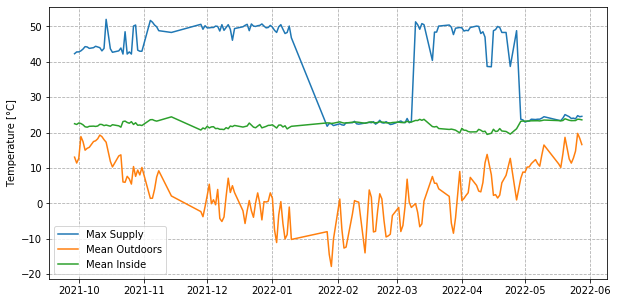

In [31]:
plt.figure(figsize = (10,5))
plt.plot(summary_daily_df.index,summary_daily_df.Max_Supply, label = 'Max Supply')
plt.plot(summary_daily_df.index,summary_daily_df.Mean_OD_Temp, label = 'Mean Outdoors')
plt.plot(summary_daily_df.index,summary_daily_df.Mean_ID_Temp, label = 'Mean Inside')
plt.grid(ls='--')
plt.legend()
plt.ylabel('Temperature [°C]')

You can clearly make out when the heat pump was operating by looking at the maximum supply temperaturew for each day. Define a heat pump dataframe and a baseboards dataframe.

In [32]:
daily_HP = summary_daily_df.loc[summary_daily_df.Max_Supply > 30]
daily_BB = summary_daily_df.loc[summary_daily_df.Max_Supply < 30]

Have a first look at the data, plotting the daily energy consumption against the mean temperature difference between indoors and outdoors for the day. It's important to use the mean temperature difference because the indoor temperature varied. Ultimately it is the temperature difference that is the driver of heat loss (and the heat required to make it up). So if the temp diff was the same, it is far to compare baseboard energy consumption against heat pump (when the correction is small). This is considered in a subsequent step.

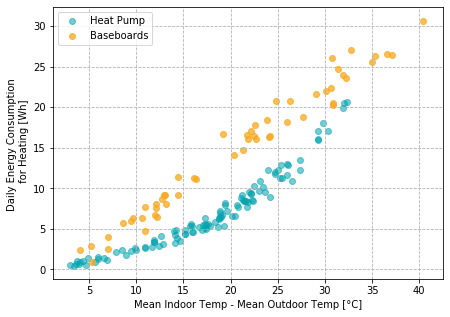

In [33]:
plt.figure(figsize = (7,5))
plt.scatter(daily_HP.Temp_diff,
            daily_HP.ASHP_Pulse_kWh,
            label = 'Heat Pump',
            color = step_blue,
            alpha = 0.55)
plt.scatter(daily_BB.Temp_diff,
            daily_BB.ASHP_Pulse_kWh, 
            label = 'Baseboards', 
            color = step_gold,
            alpha = 0.75)
plt.grid(ls='--')
plt.ylabel('Daily Energy Consumption \n for Heating [Wh]')
plt.xlabel('Mean Indoor Temp - Mean Outdoor Temp [°C]')
plt.legend()

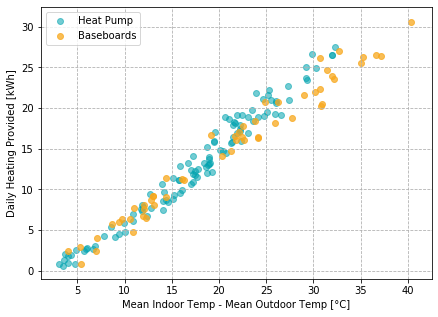

In [34]:
plt.figure(figsize = (7,5))
plt.scatter(daily_HP.Temp_diff,
            daily_HP.HP_Heat_Delivered_kWh,
            label = 'Heat Pump',
            color = step_blue,
            alpha = 0.55)
plt.scatter(daily_BB.Temp_diff,
            daily_BB.ASHP_Pulse_kWh, 
            label = 'Baseboards', 
            color = step_gold,
            alpha = 0.75)
plt.grid(ls='--')
plt.ylabel('Daily Heating Provided [kWh]')
plt.xlabel('Mean Indoor Temp - Mean Outdoor Temp [°C]')
plt.legend()
#plt.ylim(0,40)

In [35]:
# Fit for the HP data
x = np.array(daily_HP.Temp_diff).reshape((-1, 1))
y = np.array(daily_HP.ASHP_Pulse_kWh)
transformer = PolynomialFeatures(degree=4, include_bias=False)
transformer.fit(x)
x_ = transformer.transform(x)
HP_model = LinearRegression().fit(x_, y)
r_sq = HP_model.score(x_, y)
print(f"coefficient of determination: {r_sq}")
print(f"intercept: {HP_model.intercept_}")
print(f"coefficients: {HP_model.coef_}")
y_pred = HP_model.predict(x_)

coefficient of determination: 0.9811462423321184
intercept: -0.14954117736207895
coefficients: [ 2.36372015e-01 -1.09937595e-03  3.56541908e-04  2.03648452e-06]


In [36]:
# Predict HP consumption for the fit line
x = np.arange(0,45,1).reshape((-1,1))
transformer.fit(x)
x_ = transformer.transform(x)
HP_y_pred = HP_model.predict(x_)

In [37]:
# Have a look
y_pred

array([ 2.30268975,  2.78243609,  2.48317355,  0.72286605,  0.98083439,
        1.47287231,  1.29950284,  1.28962308,  0.88860388,  0.81477885,
        0.70461818,  0.56500121,  0.66256766,  0.79449498,  1.01147854,
        2.45479616,  3.15631949,  2.01316179,  1.80619194,  5.5096294 ,
        5.62980801,  4.5563781 ,  4.80431886,  5.82411286,  3.14678233,
        4.52354523,  3.44069448,  4.04435615,  3.12708174,  8.95897469,
        8.95234068,  6.94252862,  4.83727471,  4.08784828,  9.07140955,
        9.64672987, 11.49162464,  8.73123427,  7.04912818,  4.89283995,
        8.55735812,  7.76832605,  8.40999078,  5.60952659, 11.62283987,
       12.49867226, 11.12951166,  6.93283374,  3.98887401,  6.50545974,
        5.30914279,  6.62356104, 10.16801142, 13.97581768, 10.44410872,
        8.70031727, 10.65079603, 11.90083121,  8.22156534,  6.57774707,
        9.0009743 , 12.44335703,  8.06810425,  8.29012483,  8.35745597,
        6.7080019 ,  7.83642318, 16.19382174, 20.63049327, 11.77

In [38]:
# Fit for the baseboards
x = np.array(daily_BB.Temp_diff).reshape((-1, 1))
y = np.array(daily_BB.ASHP_Pulse_kWh)
transformer = PolynomialFeatures(degree=1, include_bias=False)
transformer.fit(x)
x_ = transformer.transform(x)
BB_model = LinearRegression().fit(x_, y)
r_sq = BB_model.score(x_, y)
print(f"coefficient of determination: {r_sq}")
print(f"intercept: {BB_model.intercept_}")
print(f"coefficients: {BB_model.coef_}")
y_pred = BB_model.predict(x_)

coefficient of determination: 0.9735988582207449
intercept: -1.7409754918011533
coefficients: [0.80034853]


In [95]:
# Define fit curve for basebaords
x = np.arange(0,45,1).reshape((-1,1))
transformer.fit(x)
x_ = transformer.transform(x)
BB_y_pred = BB_model.predict(x_)

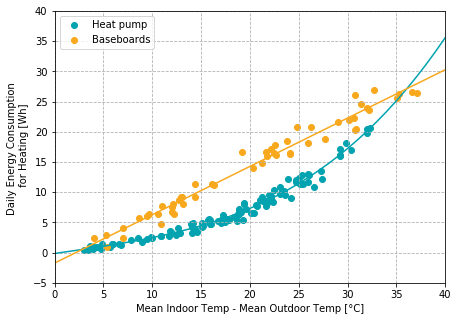

In [40]:
# Plot data and fits
plt.figure(figsize = (7,5))
plt.scatter(daily_HP.Temp_diff,daily_HP.ASHP_Pulse_kWh, color = step_blue, label = 'Heat pump')
plt.plot(x,HP_y_pred,color=step_blue)
plt.scatter(daily_BB.Temp_diff,daily_BB.ASHP_Pulse_kWh, color = step_gold, label = 'Baseboards')
plt.plot(x,BB_y_pred,color = step_gold)
plt.xlim(0,40)
plt.ylim(-5,40)
plt.grid(ls='--')
plt.ylabel('Daily Energy Consumption \n for Heating [Wh]')
plt.xlabel('Mean Indoor Temp - Mean Outdoor Temp [°C]')
plt.legend()

Want to also aggregated according to average indoor temperature.

In [41]:
daily_HP_19_20 = daily_HP.loc[(daily_HP.Mean_ID_Temp > 19)&(daily_HP.Mean_ID_Temp < 20)]
daily_HP_20_22 = daily_HP.loc[(daily_HP.Mean_ID_Temp > 20)&(daily_HP.Mean_ID_Temp < 22)]
daily_HP_22_24 = daily_HP.loc[(daily_HP.Mean_ID_Temp > 22)&(daily_HP.Mean_ID_Temp < 24)]

Replot with aggregated indoor temperatures.

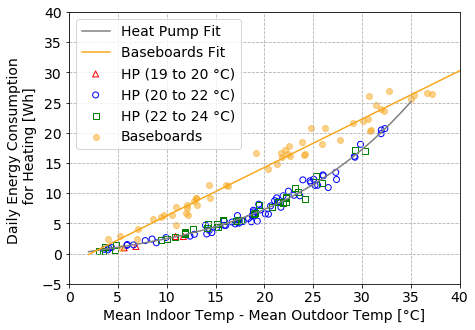

In [117]:
# Plot data and fits
plt.figure(figsize = (7,5))

plt.scatter(daily_HP_19_20.Temp_diff,
           daily_HP_19_20.ASHP_Pulse_kWh,
           edgecolors = 'red',
           facecolors = 'none',
           alpha = 1,
           label = 'HP (19 to 20 °C)',
           marker = '^')
plt.scatter(daily_HP_20_22.Temp_diff,
           daily_HP_20_22.ASHP_Pulse_kWh,
           edgecolors = 'blue',
           facecolors = 'none',
           alpha = 1,
           label = 'HP (20 to 22 °C)')
plt.scatter(daily_HP_22_24.Temp_diff,
           daily_HP_22_24.ASHP_Pulse_kWh,
           edgecolors = 'green',
           facecolors = 'none',
           alpha = 1,
           label = 'HP (22 to 24 °C)',
           marker = 's')
plt.plot(x[2:-9],HP_y_pred[2:-9],color='grey', label= 'Heat Pump Fit')
plt.scatter(daily_BB.Temp_diff,daily_BB.ASHP_Pulse_kWh, color = step_gold, label = 'Baseboards',alpha=0.5)
plt.plot(x[2:],BB_y_pred[2:],color = step_gold, label = 'Baseboards Fit')

plt.xlim(0,40)
plt.ylim(-5,40)
plt.grid(ls='--')
plt.ylabel('Daily Energy Consumption \n for Heating [Wh]')
plt.xlabel('Mean Indoor Temp - Mean Outdoor Temp [°C]')
plt.legend()

Now I want to normalize things to an indoor temperature of 22 oC because it is more inutuitive to plot against outdoor temperature than the temperature difference. 

In [42]:
daily_HP['norm_OD_Temp'] = 22 - daily_HP.Temp_diff
daily_BB['norm_OD_Temp'] = 22 - daily_BB.Temp_diff
daily_HP_20_22 = daily_HP.loc[(daily_HP.Mean_ID_Temp > 20)&(daily_HP.Mean_ID_Temp < 22)]

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


I want to again create models. This time with respect to outdoor temperature.

In [43]:
# Use the data when indoor temp was 20 to 22 oC
x = np.array(daily_HP_20_22.norm_OD_Temp).reshape((-1, 1))
y = np.array(daily_HP_20_22.ASHP_Pulse_kWh)
transformer = PolynomialFeatures(degree=4, include_bias=False)
transformer.fit(x)
x_ = transformer.transform(x)
HP_model_OD = LinearRegression().fit(x_, y)
r_sq = HP_model_OD.score(x_, y)
print(f"coefficient of determination: {r_sq}")
print(f"intercept: {HP_model_OD.intercept_}")
print(f"coefficients: {HP_model_OD.coef_}")

coefficient of determination: 0.9801781579959074
intercept: 8.778042110398607
coefficients: [-8.14570812e-01  2.76752013e-02 -3.82120917e-04  7.46496206e-07]


In [44]:
x = np.array(daily_BB.norm_OD_Temp).reshape((-1, 1))
y = np.array(daily_BB.ASHP_Pulse_kWh)
transformer = PolynomialFeatures(degree=1, include_bias=False)
transformer.fit(x)
x_ = transformer.transform(x)
BB_model_OD = LinearRegression().fit(x_, y)
r_sq = BB_model_OD.score(x_, y)
print(f"coefficient of determination: {r_sq}")
print(f"intercept: {BB_model_OD.intercept_}")
print(f"coefficients: {BB_model_OD.coef_}")

coefficient of determination: 0.9735988582207449
intercept: 15.86669216090754
coefficients: [-0.80034853]


In [45]:
# It's easier for me to implement model like this...
def model_OD(temp,system): #system = 'BB' or'HP'
    C = HP_model_OD.coef_
    BB = BB_model_OD.coef_[0] * temp + BB_model_OD.intercept_
    HP = C[3] * temp ** 4 + C[2] * temp ** 3 + C[1] * temp ** 2 + C[0] * temp + HP_model_OD.intercept_
    if temp > 18:
        energy = 0
    elif temp < -10:
        energy = BB
    elif system == 'BB':
        energy = BB
    else:
        energy = HP
    return energy  

Need this to plot the fit curves.

In [119]:
x = np.arange(-20,18,1)
y_pred_OD_HP = [model_OD(x_, 'HP') for x_ in x]
y_pred_OD_BB = [model_OD(x_, 'BB') for x_ in x]

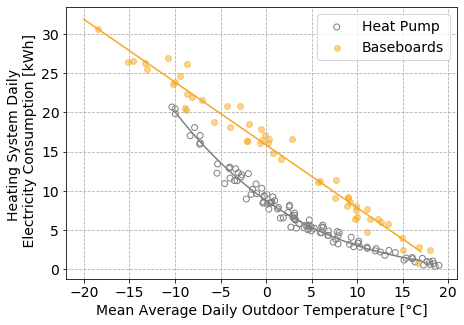

In [120]:
# Plot w.r.t outdoor temperature
plt.figure(figsize = (7,5))
plt.scatter(daily_HP.norm_OD_Temp,
            daily_HP.ASHP_Pulse_kWh, 
            edgecolors = 'grey',
            facecolors = 'none',
            alpha = 1, 
            label = 'Heat Pump',
            
            )
plt.plot(x[10:],y_pred_OD_HP[10:],color='grey')
plt.scatter(daily_BB.norm_OD_Temp,daily_BB.ASHP_Pulse_kWh, 
            #edgecolors = step_gold,
            #facecolors = 'none',
            color = step_gold,
            alpha = 0.5, 
            label = 'Baseboards')
plt.plot(x,y_pred_OD_BB,color = step_gold)
#plt.xlim(0,40)
#plt.ylim(-5,40)
plt.grid(ls='--')
plt.xlabel('Mean Average Daily Outdoor Temperature [°C]')
plt.ylabel('Heating System Daily \n Electricity Consumption [kWh]')
plt.legend()


In [48]:
daily_HP.Mean_ID_Temp.mean()

21.7307388420233

In [49]:
daily_BB.Mean_ID_Temp.mean()

23.104232308673456

In [50]:
daily_HP.loc[(daily_HP.Temp_diff > 18)&(daily_HP.Temp_diff < 22)]

,Mean_OD_Temp,Mean_ID_Temp,Max_Indoor_Temp,Min_Indoor_Temp,ASHP_Pulse_kWh,Max_Supply,HP_Heat_Delivered_kWh,Temp_diff,norm_OD_Temp
2021-11-06,3.971549,23.414944,24.31,22.44,7.999,50.4,15.899575,19.443396,2.556604
2021-11-30,-0.875222,21.047806,21.63,20.62,9.572,50.2,16.985322,21.923028,0.076972
2021-12-01,2.191062,21.795535,22.39,21.47,7.233,49.6,17.058632,19.604472,2.395528
2021-12-03,-0.071201,21.629431,22.38,21.37,7.673,49.7,18.148734,21.700632,0.299368
2021-12-04,1.033764,21.677785,22.39,21.27,7.897,49.7,18.846464,20.644021,1.355979
2021-12-05,-0.370118,21.139201,21.75,20.81,8.476,50.1,17.864873,21.509319,0.490681
2021-12-10,1.979527,21.408178,22.32,20.48,8.177,49.7,15.839700,19.428651,2.571349
2021-12-12,3.099583,21.861694,22.38,20.89,6.279,49.2,15.245987,18.762111,3.237889
2021-12-14,3.079576,22.029201,22.62,20.95,6.476,49.4,13.731580,18.949625,3.050375
2021-12-21,0.825806,22.709548,23.29,21.94,8.321,48.8,19.093078,21.883742,0.116258


Compare against the direct monitored results.

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in double_scalars


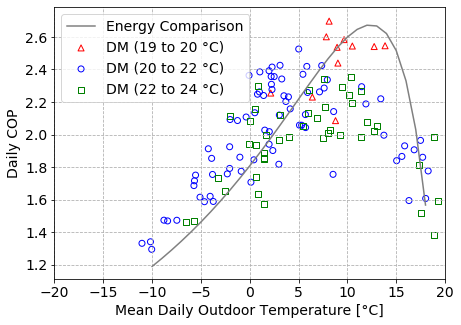

In [121]:
# Days when HP was operating
strt1 = datetime.datetime.strptime('09/28/2021', '%m/%d/%Y')
end1 = datetime.datetime.strptime('01/11/2022', '%m/%d/%Y')
strt2 = datetime.datetime.strptime('03/10/2022', '%m/%d/%Y') 
end2 = datetime.datetime.strptime('04/28/2022', '%m/%d/%Y') 

# Define dataframe when HP was operating
summary_HP = summary.loc[((summary.index > strt1)&(summary.index < end1))|
                        ((summary.index > strt2)&(summary.index < end2))]

# Want to summarize daily. Something is up with resample method... which would be my normal approach.
# It's giving incorrect date whenever there is naturally missing data (which happened twice)
# I just did it manually below

HP_dates = []
HP_dates_end = []
i = 0
while i < 365:
    date = strt1 + (i*timedelta(days=1))    
    i = i + 1
    if ((date >= strt1)&(date < end1))|((date >= strt2)&(date < end2)):
        HP_dates.append(date)
        HP_dates_end.append(date+timedelta(days=1))

OD_temps = []
Indoor_temps = []
COPs = []

for strt,end in zip(HP_dates,HP_dates_end):
    df = summary.loc[(summary.index > strt)&(summary.index < end)]
    OD_temps.append(df.Outdoor_Temp.mean())
    Indoor_temps.append(df.Indoor_Temp.mean())
    COPs.append(df.Total_Capacity_kW.sum()/df.ASHP_kW.sum())
    
summary_HP_1D = pd.DataFrame({
    'Outdoor_Temp':OD_temps,
    'Indoor_Temp':Indoor_temps,
    'COP':COPs
})

'''
# Use this to do the whole dataframe
summary_HP['Total_Capacity_kW_'] = [x if (x > 0) else 0 for x in summary_HP.Total_Capacity_kW]  # cap shouldn't go below 0; not even during defrost
summary_HP['timestamp'] = summary_HP.index
summary_HP_1D = summary_HP.groupby(pd.Grouper(key='timestamp',freq='D')).mean()
summary_HP_1D['COP'] = summary_HP_1D.Total_Capacity_kW/summary_HP_1D.ASHP_kW
'''

for date in Delete_dates:
    try:
        summary_HP_1D.drop(date, inplace = True)
    except:
        'null'
for date in missing_indices:
    try:
        summary_HP_1D.drop(date, inplace = True)
    except:
        'null'

# Aggregate data according to the indoor temperature
summary_HP_1D_19_20 = summary_HP_1D.loc[(summary_HP_1D.Indoor_Temp > 19)&(summary_HP_1D.Indoor_Temp < 20)]
summary_HP_1D_20_22 = summary_HP_1D.loc[(summary_HP_1D.Indoor_Temp > 20)&(summary_HP_1D.Indoor_Temp < 22)]
summary_HP_1D_22_24 = summary_HP_1D.loc[(summary_HP_1D.Indoor_Temp > 22)&(summary_HP_1D.Indoor_Temp < 24)]

# Define COP curve from energy comparison method
x = np.arange(-10,19,1)
y_pred_OD_HP = [model_OD(x_, 'HP') for x_ in x]
y_pred_OD_BB = [model_OD(x_, 'BB') for x_ in x]
COP = [x/y if y>0 else np.nan for x,y in zip(y_pred_OD_BB,y_pred_OD_HP)] # COP is basebaord energy divided by HP energy

# Plot COP
plt.figure(figsize = (7,5))
plt.scatter(summary_HP_1D_19_20.Outdoor_Temp,
           summary_HP_1D_19_20.COP,
           edgecolors = 'red',
           facecolors = 'none',
           alpha = 1,
           label = 'DM (19 to 20 °C)',
           marker = '^')
plt.scatter(summary_HP_1D_20_22.Outdoor_Temp,
           summary_HP_1D_20_22.COP,
           edgecolors = 'blue',
           facecolors = 'none',
           alpha = 1,
           label = 'DM (20 to 22 °C)')
plt.scatter(summary_HP_1D_22_24.Outdoor_Temp,
           summary_HP_1D_22_24.COP,
           edgecolors = 'green',
           facecolors = 'none',
           alpha = 1,
           label = 'DM (22 to 24 °C)',
           marker = 's')
plt.plot(x,COP,color = 'grey', label = 'Energy Comparison')
plt.xlabel('Mean Daily Outdoor Temperature [°C]')
plt.ylabel('Daily COP')
#plt.ylim(1,3)
plt.xlim(-20,20)
plt.grid(ls='--')
plt.legend(loc=2)

That concludes the plots provided in the companion white paper. The next section will plot some detailed data that was not included.

# 7 Detailed Data
For those wanted a deeper dive into the data some visualizations have been provided below looking at a weekly basis.

In [53]:
#Create an analyze function. You just feed in the dates and it outputs all the summary data and plots.

def summary_plots(start,end):

    #########################################################################################
    #Define dataframe for window of time input into function
    # Minutes data
    summary_plt_mins = summary.loc[(summary.index >= start) & (summary.index < end)]
    
    # Some level of hourly
    agg_hour = '4H'
    summary_plt_hrs_mean = summary.loc[(summary.index >= start) & (summary.index < end)].resample(agg_hour).mean()
    summary_plt_hrs_sum = summary.loc[(summary.index >= start) & (summary.index < end)].resample(agg_hour).sum()
    
    # Daily
    agg = '1D'
    summary_plt_days_mean = summary.loc[(summary.index >= start) & (summary.index < end)].resample(agg).mean()
    summary_plt_days_sum = summary.loc[(summary.index >= start) & (summary.index < end)].resample(agg).sum()
    summary_plt_days_min = summary.loc[(summary.index >= start) & (summary.index < end)].resample(agg).min()
    summary_plt_days_max = summary.loc[(summary.index >= start) & (summary.index < end)].resample(agg).max()

    #########################################################################################
    
    # Plot 1 - Daily Energy Consumed, Energy delivered, and COP
    fig,ax = plt.subplots(figsize = (15,6))
    
    ax.bar(summary_plt_days_sum.index,
           summary_plt_days_sum.Total_Capacity_kW * (1/60), # Data was at minutes scale convert to kWh by dividing by 60
           width = 0.4,align='edge',
           color = step_blue, 
           label = 'Delivered')
    ax.bar(summary_plt_days_sum.index,
           summary_plt_days_sum.ASHP_kW * (1/60),
           width = -0.4,align='edge', 
           color = step_gold, 
           label = 'Consumed')
    date_labels = [x.strftime('%m-%d') for x in summary_plt_days_sum.index.to_list()]
    ax.set_xticks(summary_plt_days_sum.index)
    ax.set_xticklabels(date_labels)
    
    ax2 = ax.twinx()
    ax2.plot(summary_plt_days_sum.index,
             summary_plt_days_sum.Total_Capacity_kW/summary_plt_days_sum.ASHP_kW,
             color = step_green, 
             label = 'COP')
    
    ax2.plot(summary_plt_days_sum.index,
             summary_plt_days_sum.Total_Capacity_kW/summary_plt_days_sum.Corr_ASHP_Pulse_kW, 
             color = 'grey', 
             label = 'COP corr')
    
    ax2.set_ylim(0,3.29)
    ax.grid(ls='--')    
    ax.set_ylabel('Energy [kWh]')
    ax2.set_ylabel('COP')
    legend_elements = [Patch(facecolor=step_gold, label='Consumed'),
                       Patch(facecolor=step_blue, label='Delivered'),
                       Line2D([0], [0], color=step_green, label='COP'),
                       Line2D([0], [0], color='grey', label='Corrected COP')
                      ]
    # Shrink current axis's height by 10% on the bottom
    box = ax.get_position()
    ax.set_position([box.x0, box.y0 + box.height * 0.15,
                 box.width, box.height * 0.85])

    # Put a legend below current axis
    ax.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.07),
          fancybox=True, ncol=4)     
    
    ax.set_title('Plot 1: ' + start.strftime('%m/%d/%Y') + ' To ' + end.strftime('%m/%d/%Y'))
    
    #########################################################################################
    # Plot 2 - Daily Time On and Mean Cycle Time 
    fig,ax = plt.subplots(figsize = (15,6))
    ax.bar(summary_plt_days_sum.index,
           summary_plt_days_sum.ON * (1/60), # Hours
           width = 0.4,
           align='edge',
           color = step_blue, 
           label = 'Total Time ON')
    ax.bar(summary_plt_days_sum.index,
           summary_plt_days_sum.ON*(1/60)/summary_plt_days_sum.Turned_ON,
           width = -0.4,
           align='edge', 
           color = step_gold, 
           label = 'Mean Cycle Time')
    date_labels = [x.strftime('%m-%d') for x in summary_plt_days_sum.index.to_list()]
    ax.set_xticks(summary_plt_days_sum.index)
    ax.set_xticklabels(date_labels)
    ax.grid(ls='--')    
    ax.set_ylabel('Time On or Mean Cycle Time [Hours]')
    legend_elements = [Patch(facecolor=step_gold, label='Mean Cycle Time'),
                       Patch(facecolor=step_blue, label='Time On')                       
                      ]
    # Shrink current axis's height by 10% on the bottom
    box = ax.get_position()
    ax.set_position([box.x0, box.y0 + box.height * 0.15,
                 box.width, box.height * 0.85])

    # Put a legend below current axis
    ax.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.07),
          fancybox=True, ncol=2)  
    
    ax.set_title('Plot 2: ' + start.strftime('%m/%d/%Y') + ' To ' + end.strftime('%m/%d/%Y'))


    
    #########################################################################################
    # Plot 3 - Daily Outdoor Temperature Mean, Min, and Max
    fig,ax = plt.subplots(figsize = (15,6))
    ax.plot(summary_plt_days_mean.index,summary_plt_days_mean.Outdoor_Temp, color = step_blue, label = 'Mean')
    ax.plot(summary_plt_days_max.index,summary_plt_days_max.Outdoor_Temp, color = step_gold, label = 'Max')
    ax.plot(summary_plt_days_min.index,summary_plt_days_min.Outdoor_Temp, color = 'grey', label = 'Min')    
    date_labels = [x.strftime('%m-%d') for x in summary_plt_days_sum.index.to_list()]
    ax.set_xticks(summary_plt_days_sum.index)
    ax.set_xticklabels(date_labels)
    ax.grid(ls='--')    
    ax.set_ylabel('Outdoor Temperature [℃]')
    legend_elements = [Line2D([0], [0], color=step_blue, label='Mean'),
                       Line2D([0], [0], color=step_gold, label='Max'),
                       Line2D([0], [0], color='grey', label='Min')               
                      ]
    # Shrink current axis's height by 10% on the bottom
    box = ax.get_position()
    ax.set_position([box.x0, box.y0 + box.height * 0.15,
                 box.width, box.height * 0.85])

    # Put a legend below current axis
    ax.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.07),
          fancybox=True, ncol=3)  
    
    ax.set_title('Plot 3: ' + start.strftime('%m/%d/%Y') + ' To ' + end.strftime('%m/%d/%Y'))
 

    #########################################################################################
    # Plot 4 - Minute Exhaust, Intake, and Outdoor Temperatures
    fig,ax = plt.subplots(figsize = (15,6))
    ax.plot(summary_plt_mins.index,summary_plt_mins.OD_Exhaust,alpha=0.5,color = step_blue, label='Exhaust')
    ax.plot(summary_plt_mins.index,summary_plt_mins.OD_Intake,alpha=0.5, color = step_gold, label='Intake')
    ax.plot(summary_plt_mins.index,summary_plt_mins.Outdoor_Temp,alpha=0.5, color = step_green, label='OD_Temp')
    ax.grid(ls='--')
    ax.xaxis.set_major_formatter(myFmt1)
    ax2 = ax.twinx()
    ax2.plot(summary_plt_mins.index,summary_plt_mins.Capacity_kW,color = 'grey',alpha=0.5)
    #ax2.set_ylim(0,summary_plt_mins.Capacity_kW.max()*3)
    legend_elements = [Line2D([0], [0], color=step_blue, label='Exhaust Temp.'),
                       Line2D([0], [0], color=step_gold, label='Intake Temp.'),
                       Line2D([0], [0], color=step_green, label='Outdoor Temp.'),
                       Line2D([0], [0], color='grey', alpha = 0.5, label='Heat from Air')
                      ]
    # Shrink current axis's height by 10% on the bottom
    box = ax.get_position()
    ax.set_position([box.x0, box.y0 + box.height * 0.15,
                 box.width, box.height * 0.85])

    # Put a legend below current axis
    ax.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.07),
          fancybox=True, ncol=4) 
    
    ax.set_ylabel('Temperature [℃]')
    ax2.set_ylabel('Heat from Air [kW]')
    ax2.xaxis.set_major_formatter(myFmt1)
    
    ax.set_title('Plot 4: ' + start.strftime('%m/%d/%Y') + ' To ' + end.strftime('%m/%d/%Y'))
    
    #########################################################################################    
    # Plot 5 - 4-hour A COP vs. Intake Temperature
    fig,ax = plt.subplots(figsize=(15,6))
    ax.scatter(summary_plt_hrs_mean.Outdoor_Temp,
               summary_plt_hrs_sum.Total_Capacity_kW/summary_plt_hrs_sum.ASHP_kW,
               color=step_blue)
    ax.scatter(summary_plt_hrs_mean.Outdoor_Temp,
               summary_plt_hrs_sum.Total_Capacity_kW/summary_plt_hrs_sum.Corr_ASHP_Pulse_kW, 
               color=step_gold)
    ax.set_xlabel('Outdoor Temperature [℃]')
    ax.set_ylabel(agg_hour + ' Aggregated COP')
    ax.grid(ls='--')
    ax.set_ylim(0,4)    
    legend_elements = [Line2D([0], [0], marker='o', color='w', label='COP', markerfacecolor=step_blue, markersize=10),
                       Line2D([0], [0], marker='o', color='w', label='Corrected COP', markerfacecolor=step_gold, markersize=10)
                      ]
    # Shrink current axis's height by 10% on the bottom
    box = ax.get_position()
    ax.set_position([box.x0, box.y0 + box.height * 0.25,
                 box.width, box.height * 0.75])

    # Put a legend below current axis
    ax.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.15),
          fancybox=True, ncol=2) 
    
    ax.set_title('Plot 5: ' + start.strftime('%m/%d/%Y') + ' To ' + end.strftime('%m/%d/%Y'))

    #########################################################################################
    # PLot 6 - Minute Supply and Return Temperatures
    fig,ax = plt.subplots(figsize = (15,6))
    ax.plot(summary_plt_mins.index,summary_plt_mins.Indoor_Temp,alpha=1,color = step_blue)
    ax2 = ax.twinx()
    ax2.plot(summary_plt_mins.index,summary_plt_mins.Supply_Temp,alpha=1, color = step_gold)
    ax.grid(ls='--')
    ax.set_ylabel('Return Temperature [℃]')
    ax2.set_ylabel('Supply Temperature [℃]')
    ax.xaxis.set_major_formatter(myFmt1)
    legend_elements = [Line2D([0], [0], color=step_blue, label='Return'),
                   Line2D([0], [0], color=step_gold, label='Supply'),
                  ]
    # Shrink current axis's height by 10% on the bottom
    box = ax.get_position()
    ax.set_position([box.x0, box.y0 + box.height * 0.15,
                 box.width, box.height * 0.85])

    # Put a legend below current axis
    ax.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.07),
          fancybox=True, ncol=2) 
    
    ax.set_title('Plot 6: ' + start.strftime('%m/%d/%Y') + ' To ' + end.strftime('%m/%d/%Y'))
    
    #########################################################################################
    # Plot 7 & 8 - Frequency Histogram of Supply and Return Temperatures
    bins=np.arange(18,26,0.25)
    fig,ax = plt.subplots(figsize=(15,5))
    ax.hist(summary_plt_mins.Indoor_Temp,bins,color=step_blue)
    ax.set_xlabel('Return Temperature')
    ax.set_ylabel('Frequency (Minutes)')
    ax.set_title('Plot 7: ' + start.strftime('%m/%d/%Y') + ' To ' + end.strftime('%m/%d/%Y'))
    
    summary_plt2 = summary_plt_mins.loc[summary_plt_mins.Capacity_kW > 0.05]
    bins=np.arange(18,50,1)
    fig,ax = plt.subplots(figsize=(15,5))
    ax.hist(summary_plt2.Supply_Temp,bins,color=step_gold)
    ax.set_xlabel('Supply Temperature When ON')
    ax.set_ylabel('Frequency (Minutes)')
    ax.set_title('Plot 8: ' + start.strftime('%m/%d/%Y') + ' To ' + end.strftime('%m/%d/%Y'))

    #########################################################################################
    # PLot 9 - Minute Outdoor Airflow
    fig,ax = plt.subplots(figsize=(15,5))
    ax.plot(summary_plt_mins.index,summary_plt_mins.Airflow_cfm,color=step_blue)
    ax.set_ylabel('Outdoor Airflow [cfm]')
    plt.grid(ls='--')
    ax.xaxis.set_major_formatter(myFmt1)
    ax.set_title('Plot 9: ' + start.strftime('%m/%d/%Y') + ' To ' + end.strftime('%m/%d/%Y'))
   
    #########################################################################################    
    # PLot 10 - Frequency Histogram of Outdoor Airflow
    summary_plt2 = summary_plt_mins.loc[summary_plt_mins.Capacity_kW > 0.05]
    bins=np.arange(0,250,10)
    fig,ax = plt.subplots(figsize=(15,5))
    ax.hist(summary_plt2.Airflow_cfm,bins,color=step_blue)
    ax.set_xlabel('Outdoor Airflow When ON [cfm]')
    ax.set_ylabel('Frequency (Minutes)')   
    ax.set_title('Plot 10: ' + start.strftime('%m/%d/%Y') + ' To ' + end.strftime('%m/%d/%Y'))
   
    #########################################################################################
    # Plot 11 - Minute Time Series Heat Removed from Outdoor Air
    fig,ax = plt.subplots(figsize=(15,5))
    ax.plot(summary_plt_mins.index,summary_plt_mins.Capacity_kW,color=step_blue)
    ax.set_ylabel('Heat Removed from Outdoor Air (kW)')   
    ax.grid(ls='--')
    ax.xaxis.set_major_formatter(myFmt1)
    ax.set_title('Plot 11: ' + start.strftime('%m/%d/%Y') + ' To ' + end.strftime('%m/%d/%Y'))
    
    #########################################################################################
    # Plot 12 - Frequency Histogram Heat Removed From Air
    summary_plt2 = summary_plt_mins.loc[summary_plt_mins.Airflow_cfm > 50]
    bins = np.arange(-1.5,1.5,0.05)
    fig,ax = plt.subplots(figsize=(15,5))
    ax.hist(summary_plt2.Capacity_kW,bins,color=step_blue)
    ax.set_xlabel('Heat Removed from Outdoor Air When ON (kW)')   
    ax.set_ylabel('Frequency (Minutes)')
    ax.set_title('Plot 12: ' + start.strftime('%m/%d/%Y') + ' To ' + end.strftime('%m/%d/%Y'))
    
    #########################################################################################
    #  Plot 13 - Cycle Time vs. Mean Daily Temperature
    fig,ax = plt.subplots(figsize=(15,5))
    ax.scatter(summary_plt_days_mean.Outdoor_Temp,
               summary_plt_days_sum.ON/summary_plt_days_sum.Turned_ON,
               color=step_blue)
    ax.set_xlabel('Mean Daily Temperature [℃]')
    ax.set_ylabel('Cycle Time [Minutes]')
    ax.grid(ls='--')
    ax.set_title('Plot 13: ' + start.strftime('%m/%d/%Y') + ' To ' + end.strftime('%m/%d/%Y'))
   
    #########################################################################################
    # Plot 14 - Daily energy for lights 
    fig,ax = plt.subplots(figsize = (15,6))
    ax.bar(summary_plt_days_sum.index,summary_plt_days_sum.Lights_Pulse_kWh,
           width = 0.4,align='edge',
           color = step_blue, 
           label = 'Lights')
    date_labels = [x.strftime('%m-%d') for x in summary_plt_days_sum.index]
    ax.set_xticks(summary_plt_days_sum.index)
    ax.set_xticklabels(date_labels)
    ax.grid(ls='--')    
    ax.set_ylabel('Energy [kWh]')
    ax.set_title('Plot 14: ' + start.strftime('%m/%d/%Y') + ' To ' + end.strftime('%m/%d/%Y'))
  
    #########################################################################################
    # Plot 15 - Frequency Histogram of Outdoor delta T 
    summary_plt2 = summary_plt_mins.loc[summary_plt_mins.Capacity_kW > 0.05]
    bins = np.arange(0,10,0.5)
    fig, ax = plt.subplots(figsize=(15,5))
    ax.hist(summary_plt2.OD_Intake - summary_plt2.OD_Exhaust,bins,color=step_blue)
    ax.set_xlabel('Intake Temp - Exhaust Temp [℃]')
    ax.set_ylabel('Frequency (Minutes)')
    ax.set_title('Plot 15: ' + start.strftime('%m/%d/%Y') + ' To ' + end.strftime('%m/%d/%Y'))
    
    #########################################################################################
    # Plot 16 - Minute Level COP
    summary_plt2 = summary_plt_mins.loc[summary_plt_mins.Capacity_kW > 0.05]
    fig, ax = plt.subplots(figsize=(15,5))
    ax.plot(summary_plt2.resample('5min').mean().index,summary_plt2.resample('5min').mean().COP,color=step_blue)
    ax.set_ylabel('5 Minute-level COP')
    ax.set_title('Plot 16: ' + start.strftime('%m/%d/%Y') + ' To ' + end.strftime('%m/%d/%Y'))
    ax.set_ylim(0,4)
    ax.grid(ls='--')
    
    #########################################################################################
    # Plot 17 - Indoor Fan
    summary_plt2 = summary_plt_mins.loc[summary_plt_mins.Capacity_kW > 0.05]
    fig, ax = plt.subplots(figsize=(15,5))
    ax.plot(summary_plt2.index,summary_plt2.DP_Indoor_Fan,color=step_blue)
    ax.set_ylabel('Diffential Pressure')
    ax.set_title('Plot 16: ' + start.strftime('%m/%d/%Y') + ' To ' + end.strftime('%m/%d/%Y'))
    ax.grid(ls='--')
    
    return


In [54]:
# Creat a list of start dates and end dates looking 1 week at a time
start_date = datetime.datetime.strptime('09/26/2021', '%m/%d/%Y')
end_date = start_date + timedelta(days = 7)

start_dates = [start_date]
end_dates = [end_date]

i = 1
while i < 35:
    start_dates.append(start_date + (i*timedelta(days=7)))
    end_dates.append(end_date + (i*timedelta(days=7)))
    i = i + 1

Go through each week of the monitoring. Recall some periods are actually baseboards. Baseboards were used 01/11/2022 to 03/09/2022 and after 04/28/2022. Note that when the baseboards are operating the data from some sensors is not useful. For example, the intake and exhaust sensors. The grids were removed from their installed position. I've included 1 week from each month. Otherwise the file is too large to upload to github. You can uncomment the other weeks if you want to run this on your local computer.

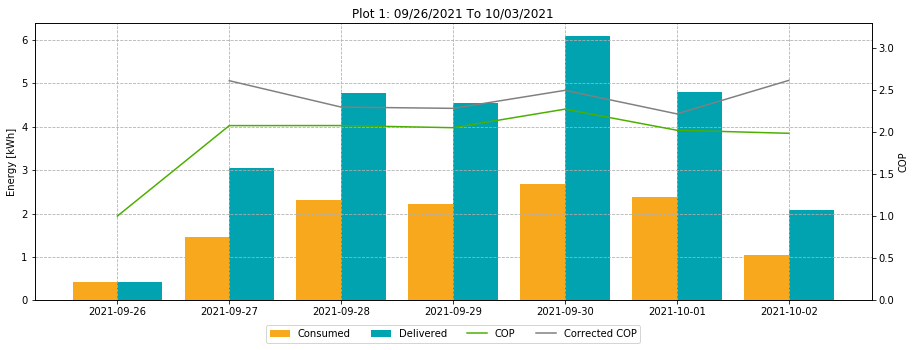

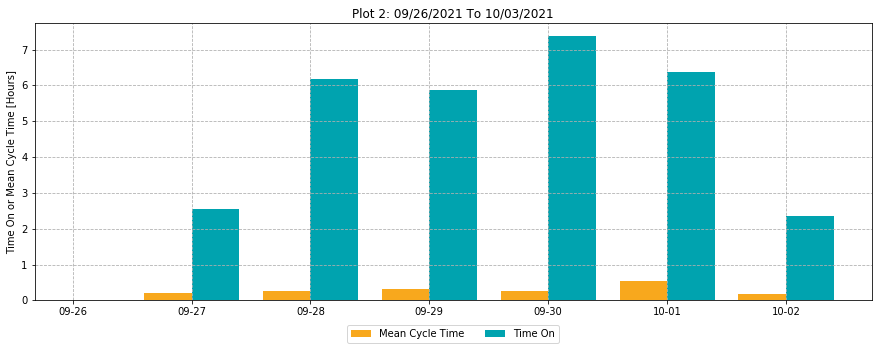

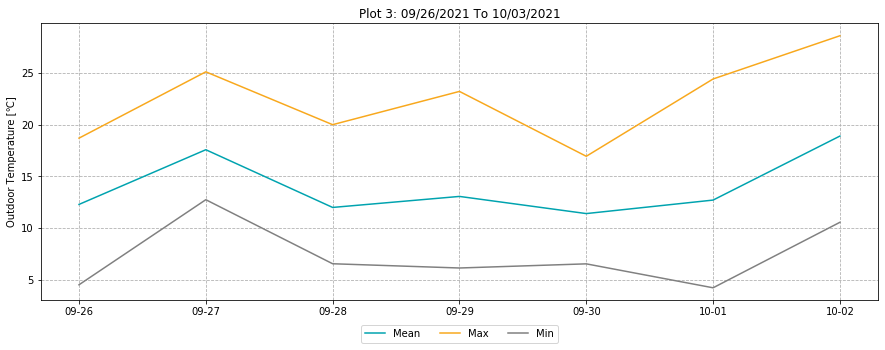

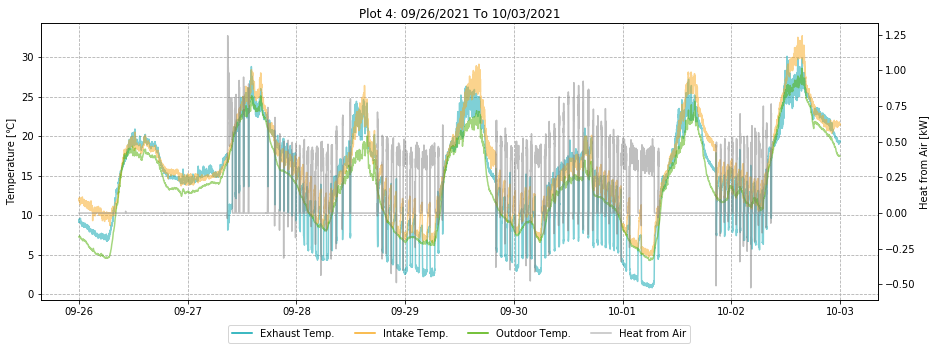

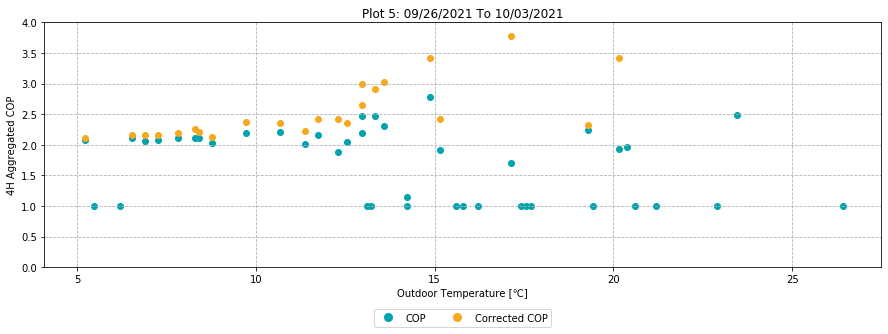

...

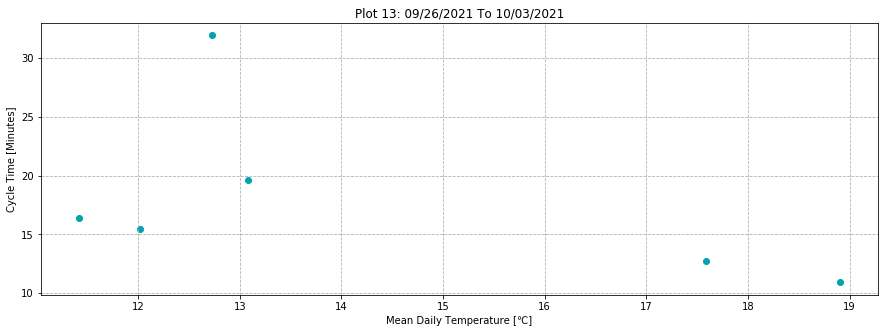

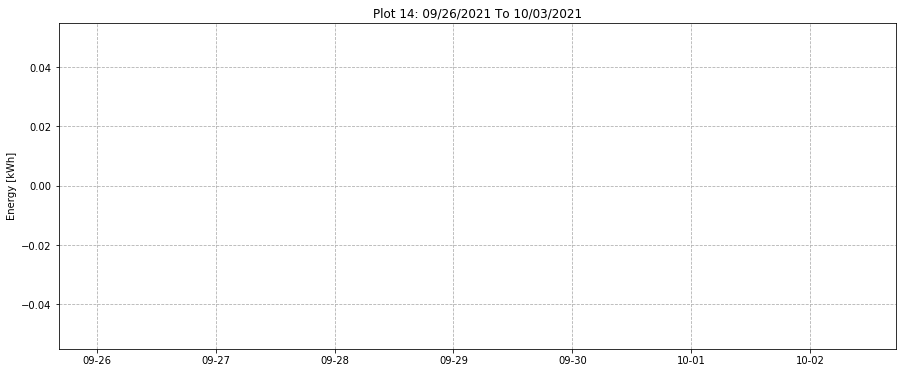

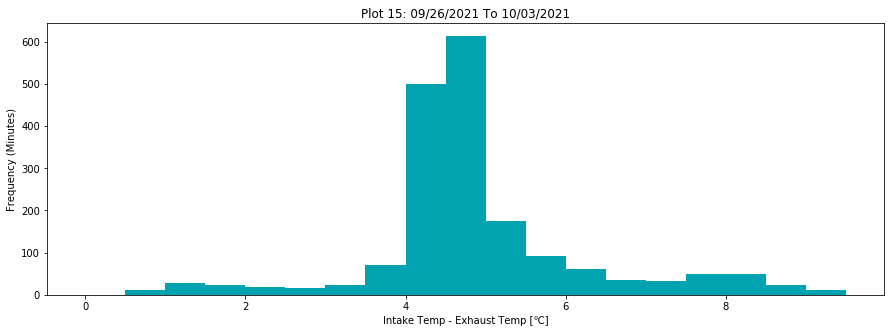

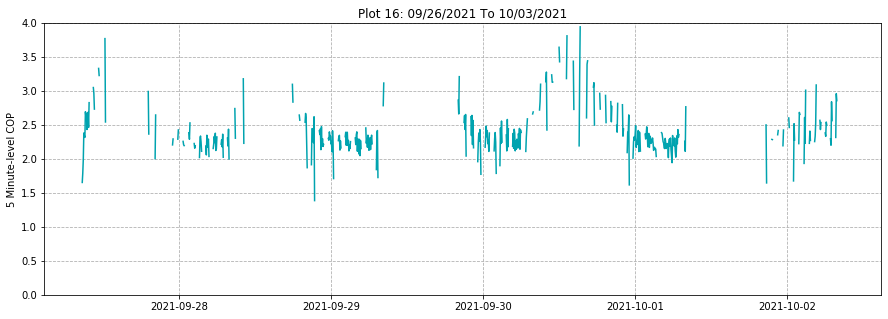

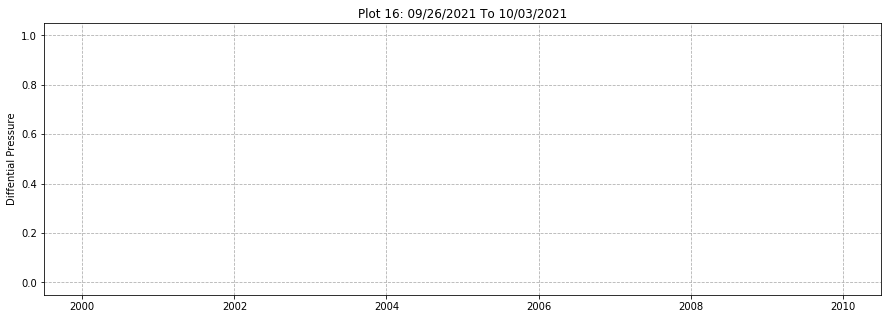

In [55]:
summary_plots(start_dates[0],end_dates[0])

In [122]:
#summary_plots(start_dates[1],end_dates[1])

In [123]:
#summary_plots(start_dates[2],end_dates[2])

In [124]:
#summary_plots(start_dates[3],end_dates[3])

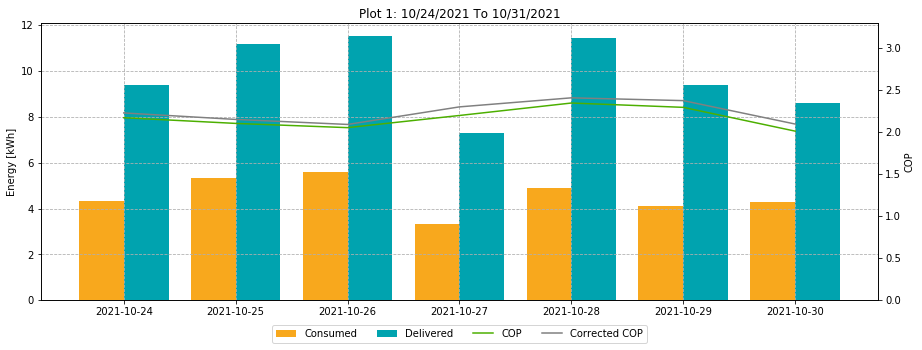

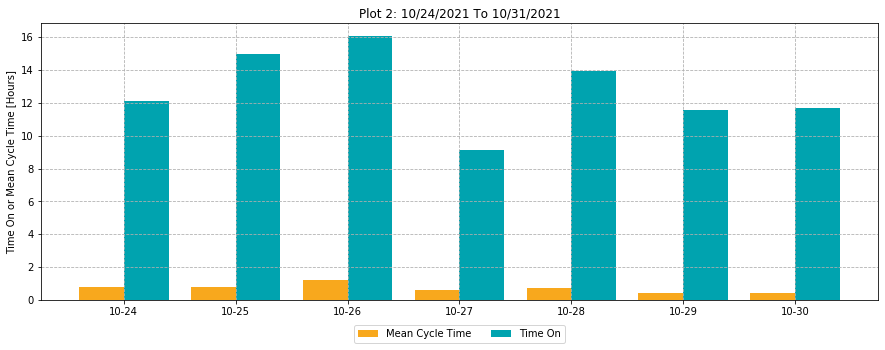

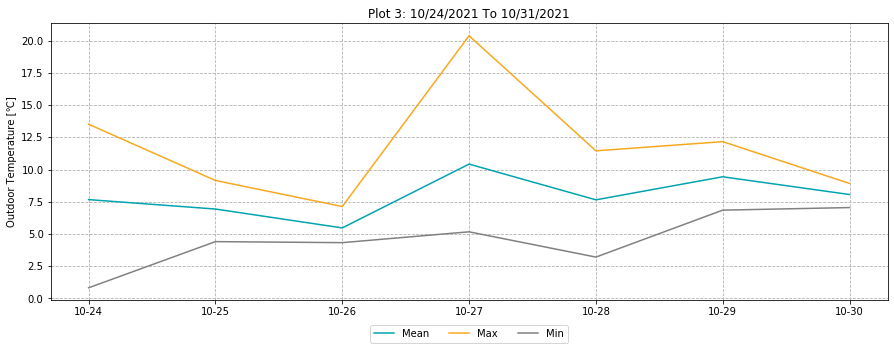

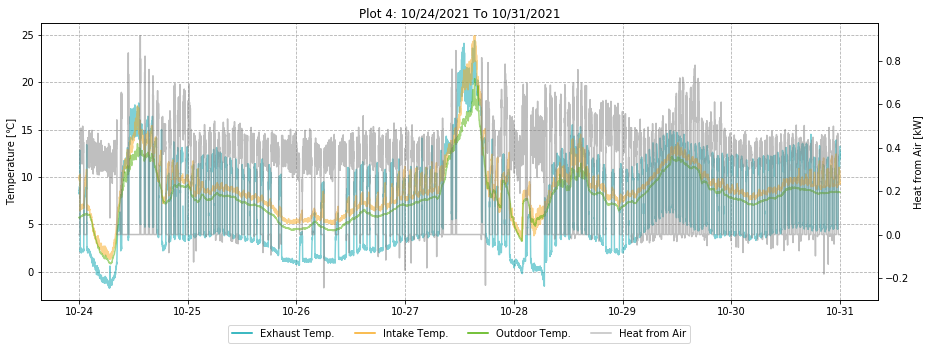

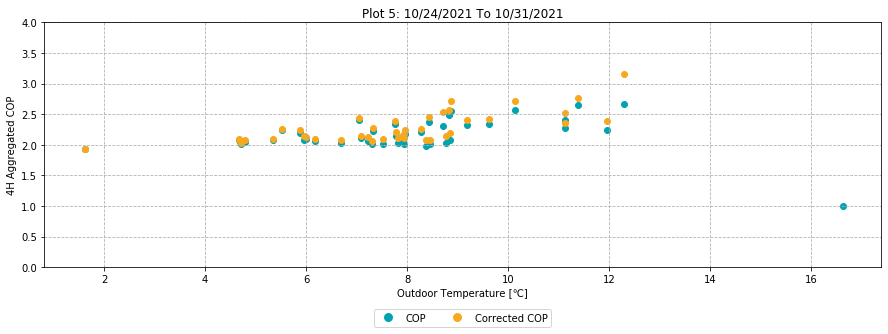

...

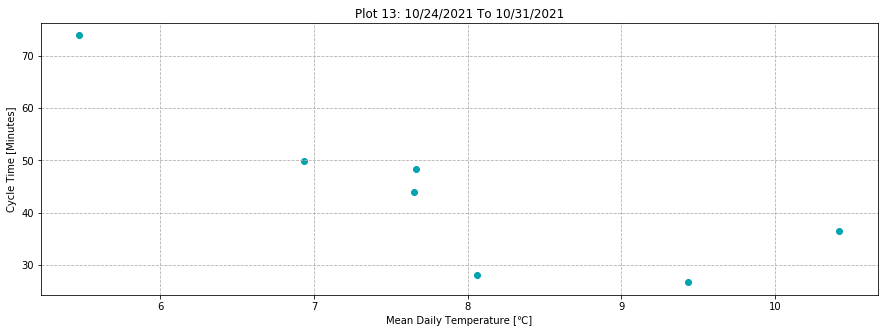

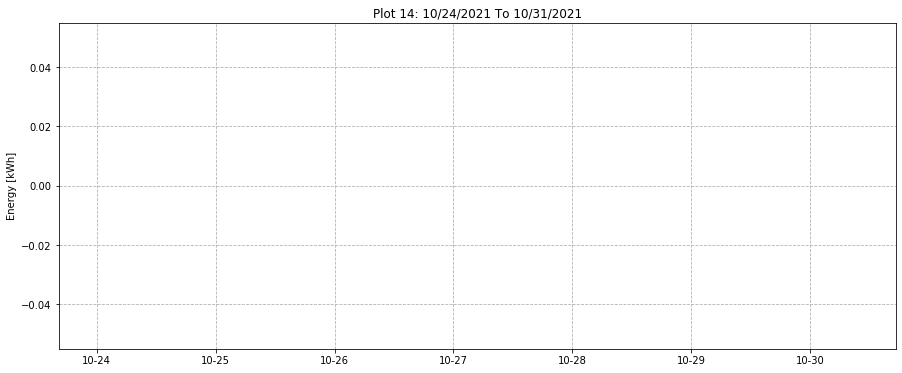

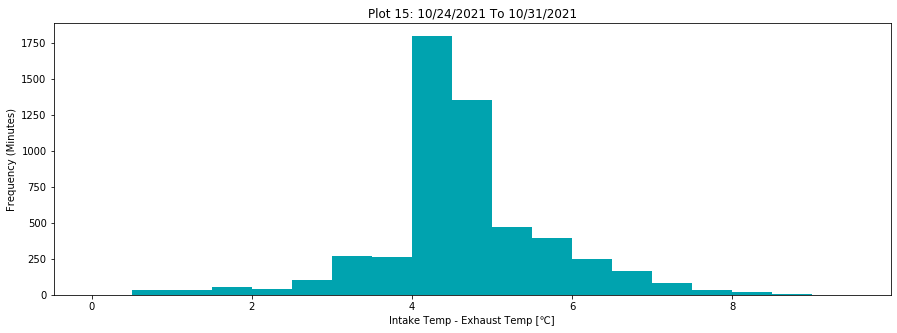

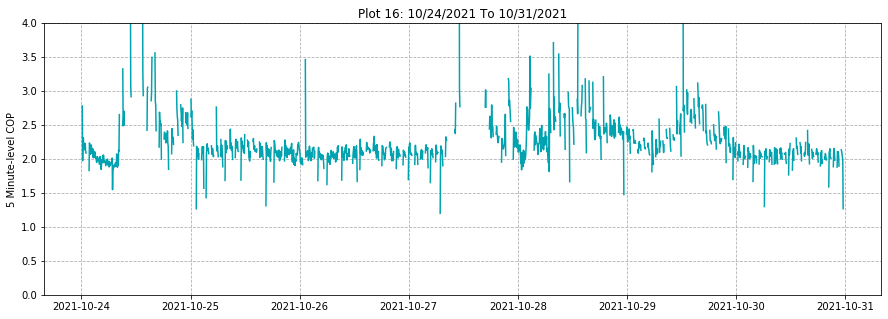

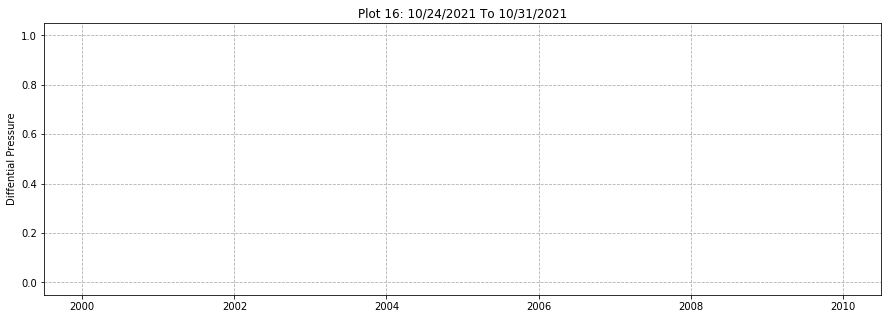

In [59]:
summary_plots(start_dates[4],end_dates[4])

In [125]:
#summary_plots(start_dates[5],end_dates[5])

In [126]:
#summary_plots(start_dates[6],end_dates[6])

In [127]:
#summary_plots(start_dates[7],end_dates[7])

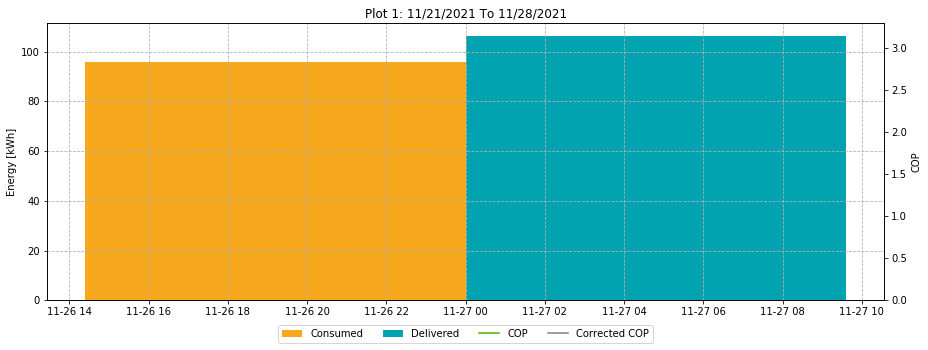

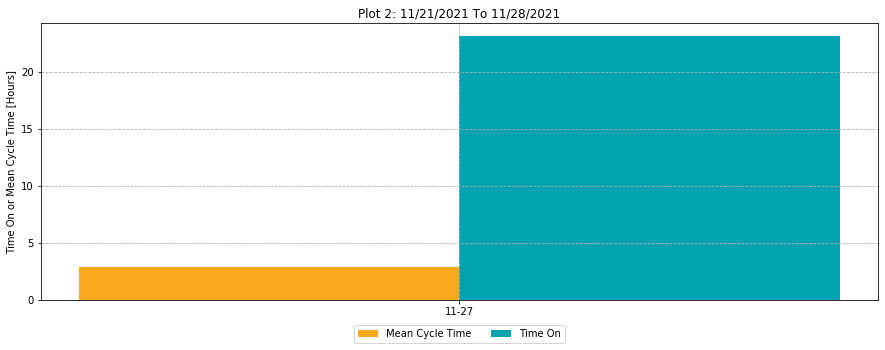

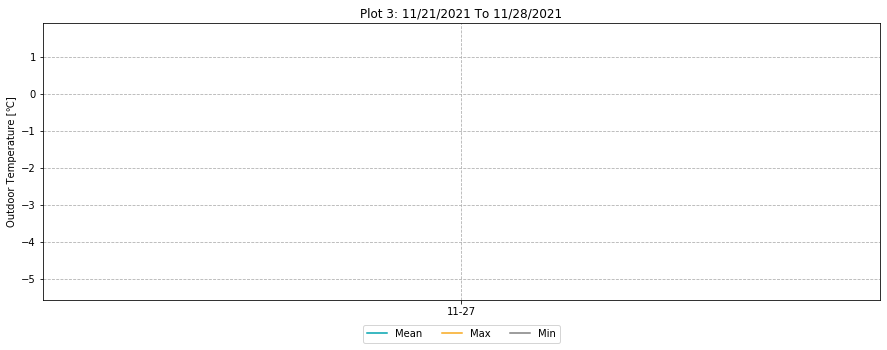

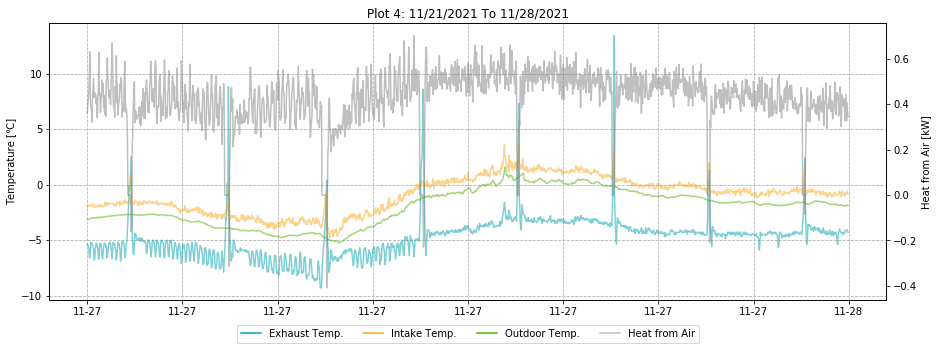

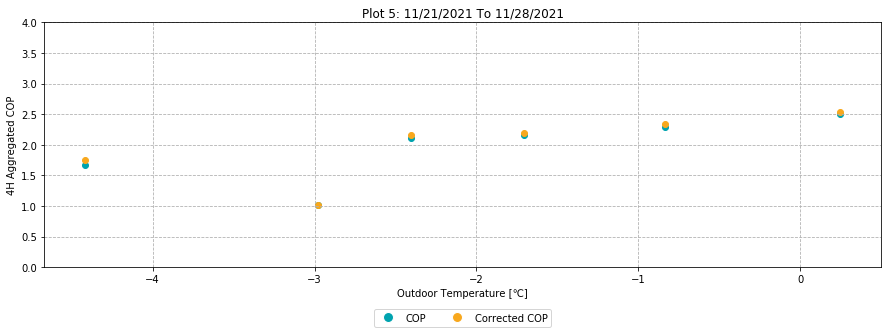

...

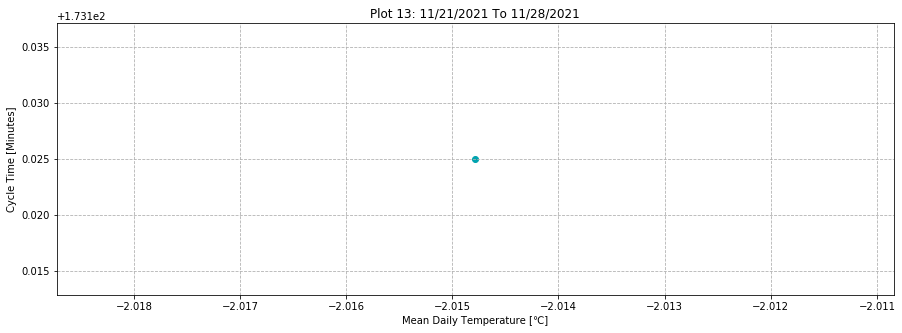

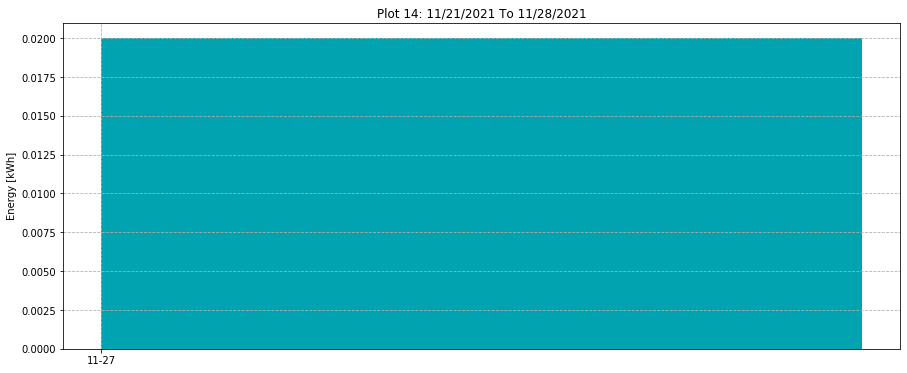

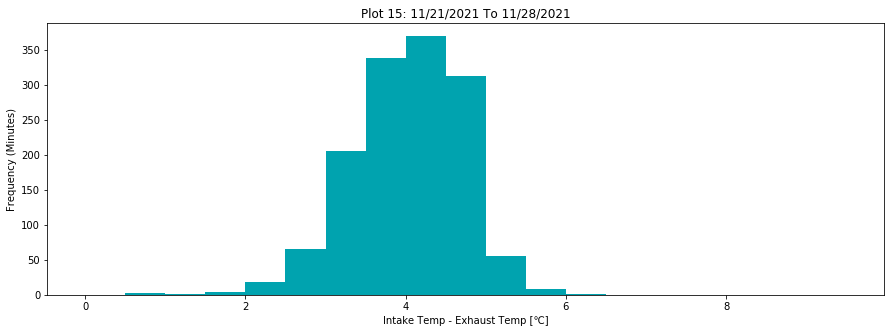

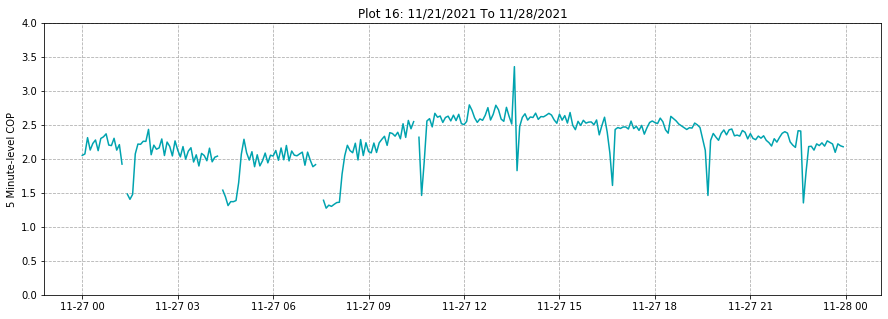

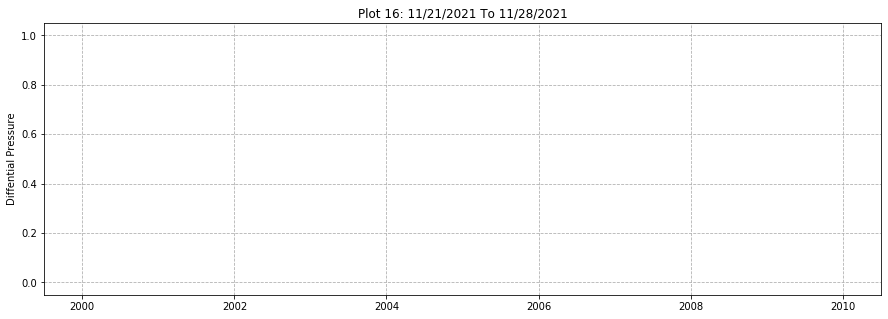

In [63]:
summary_plots(start_dates[8],end_dates[8])

In [128]:
#summary_plots(start_dates[9],end_dates[9])

In [129]:
#summary_plots(start_dates[10],end_dates[10])

In [130]:
#summary_plots(start_dates[11],end_dates[11])

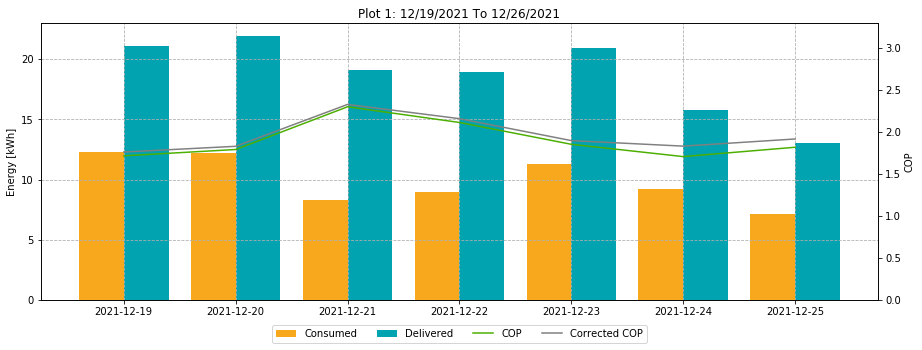

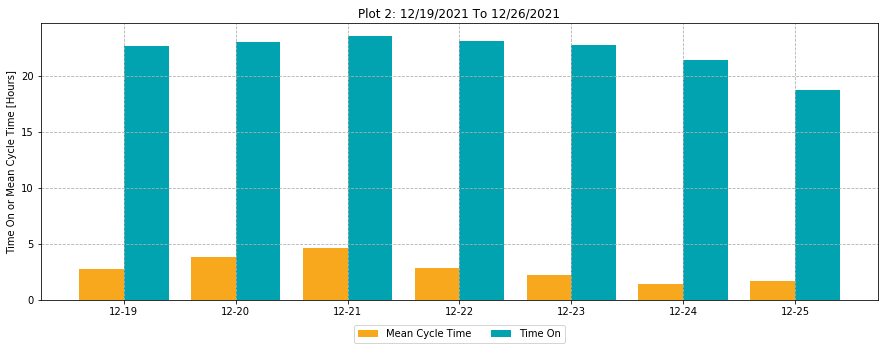

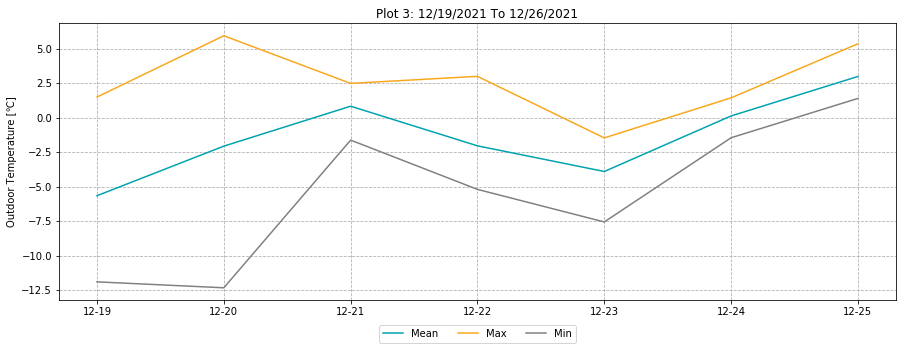

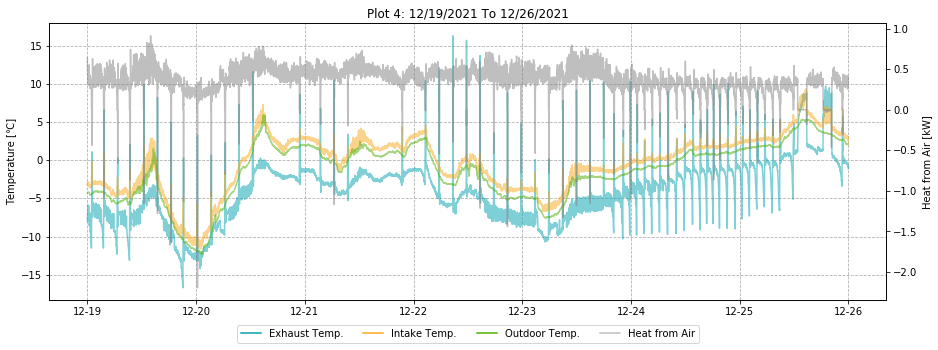

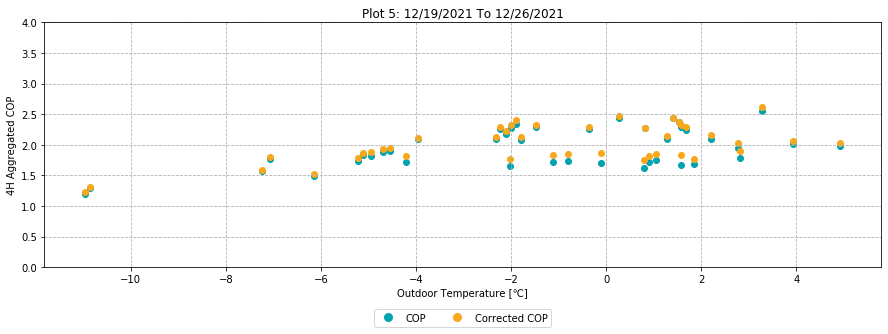

...

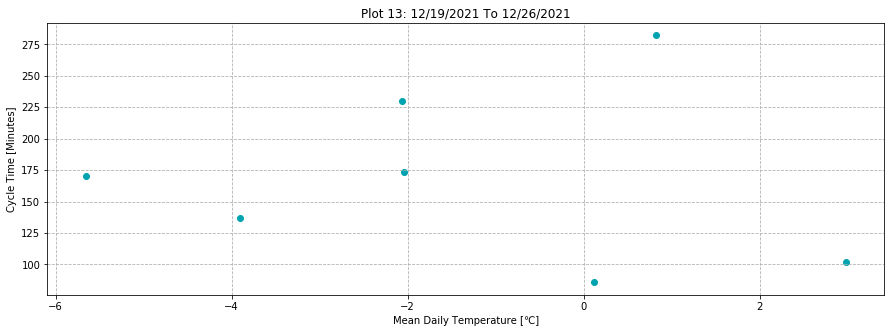

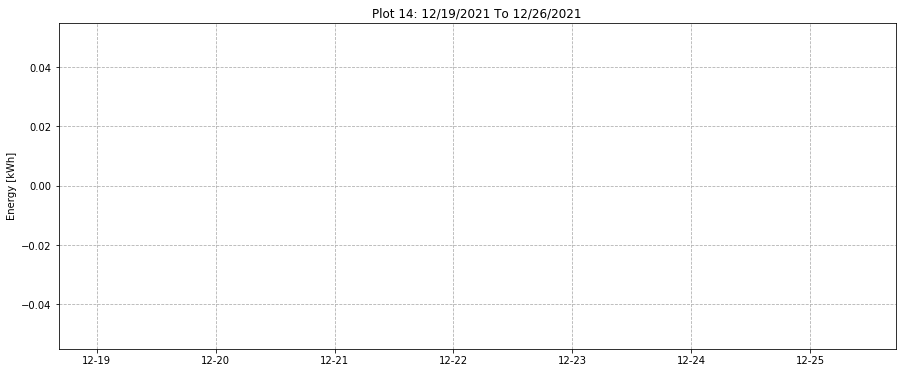

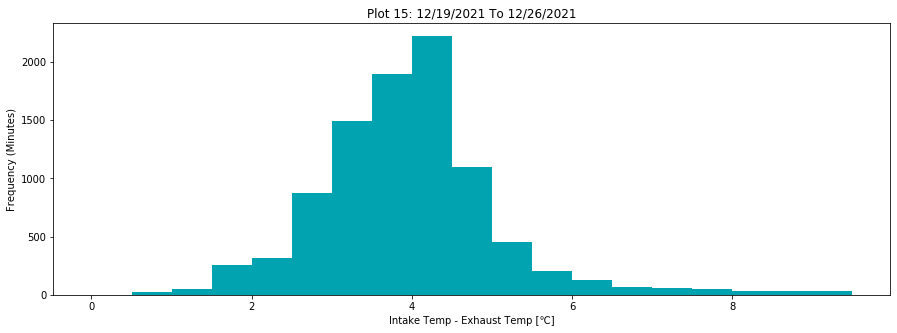

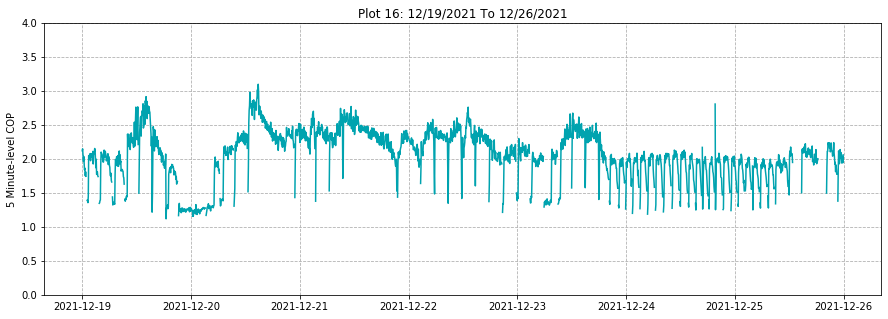

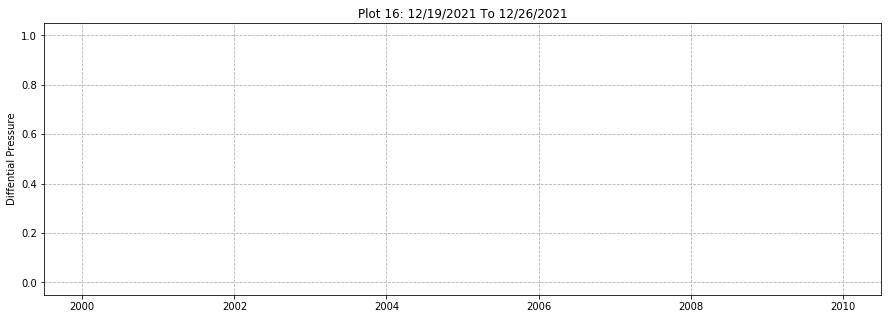

In [67]:
summary_plots(start_dates[12],end_dates[12])

In [131]:
#summary_plots(start_dates[13],end_dates[13])

In [132]:
#summary_plots(start_dates[14],end_dates[14])

In [133]:
#summary_plots(start_dates[15],end_dates[15])

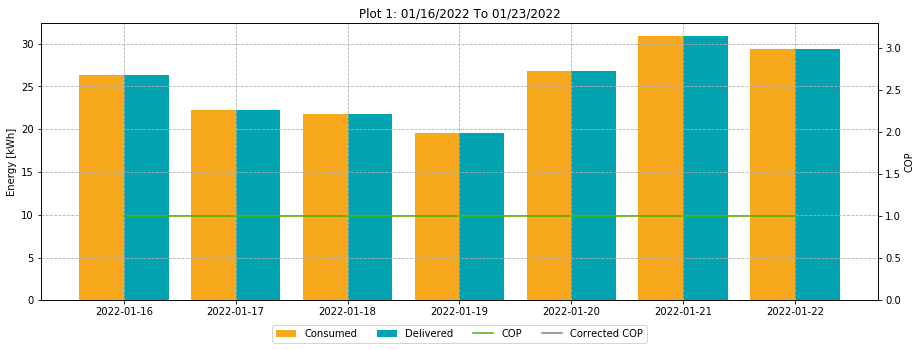

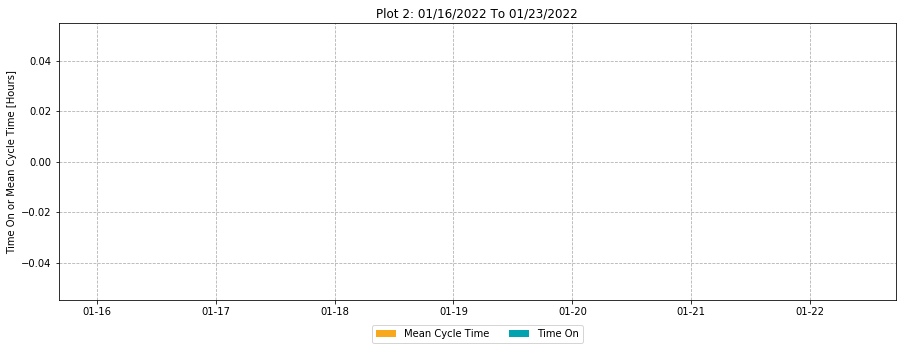

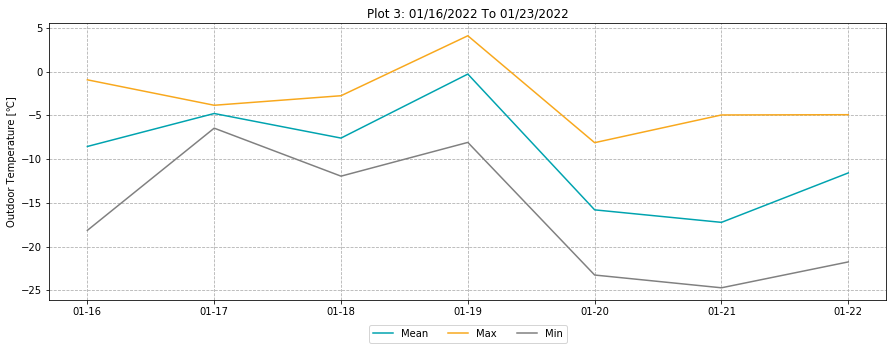

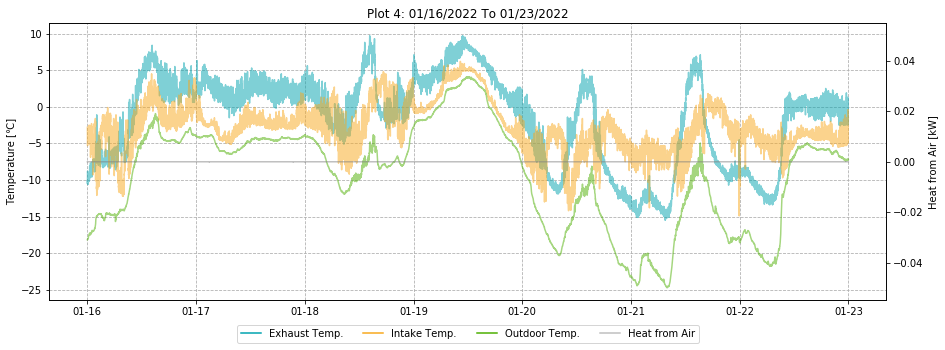

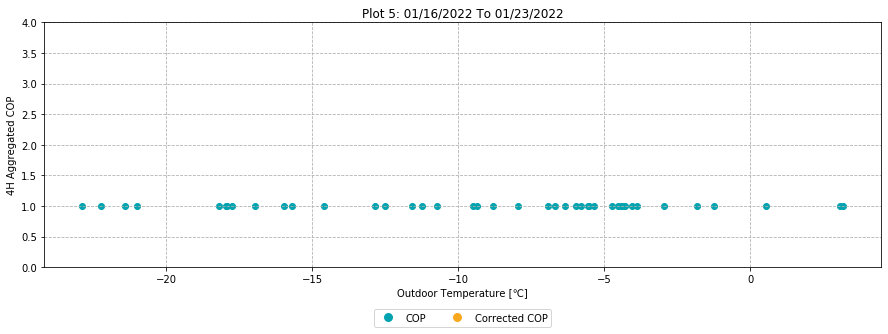

...

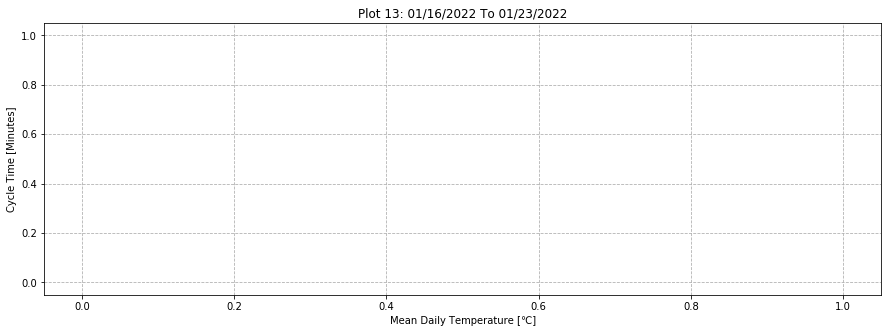

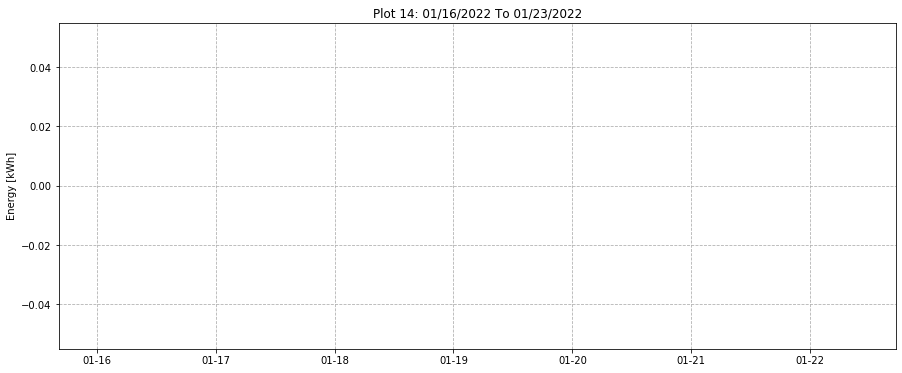

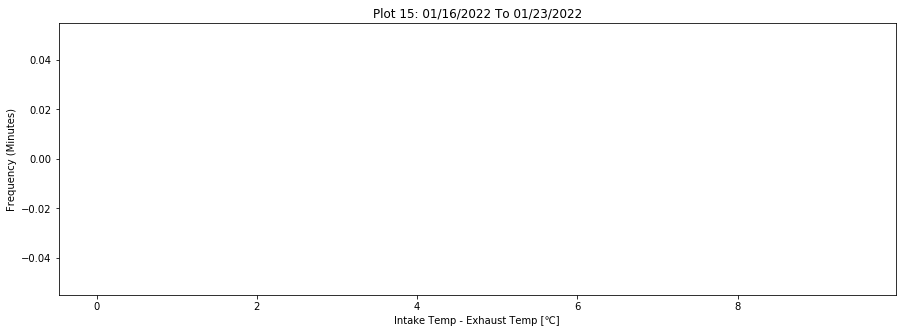

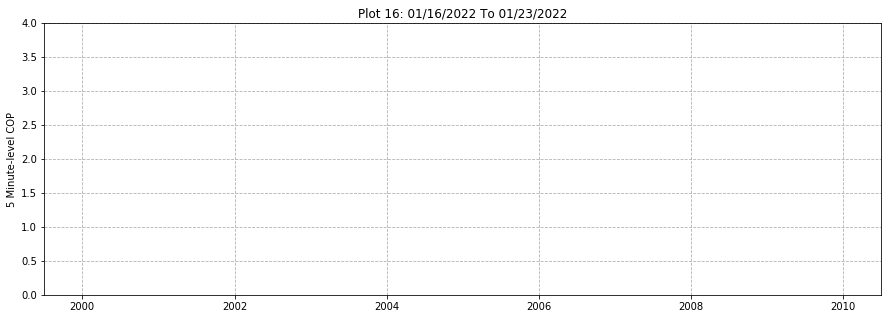

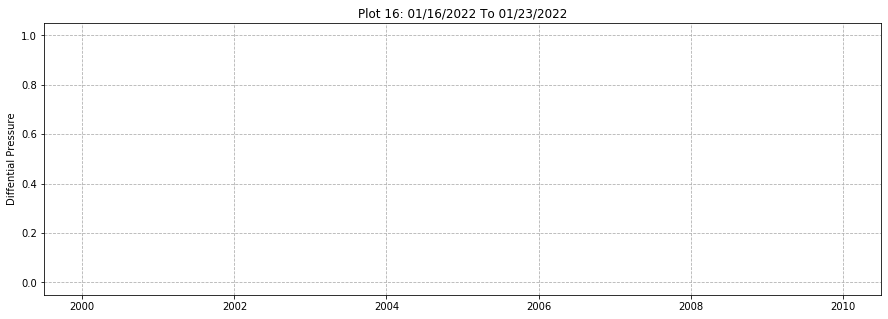

In [71]:
summary_plots(start_dates[16],end_dates[16])

In [134]:
#summary_plots(start_dates[17],end_dates[17])

In [135]:
#summary_plots(start_dates[18],end_dates[18])

In [136]:
#summary_plots(start_dates[19],end_dates[19])

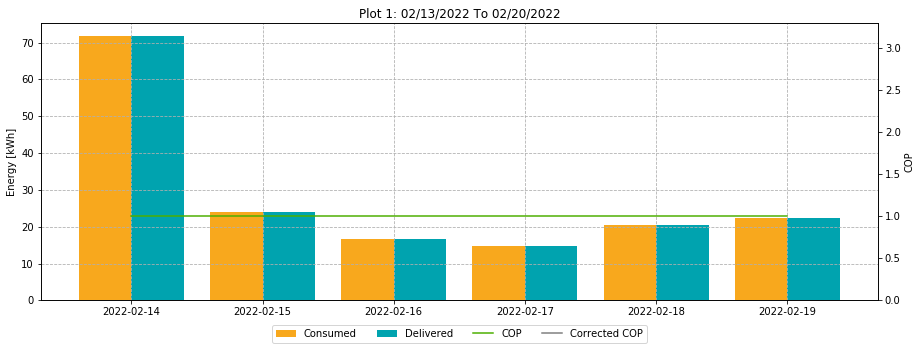

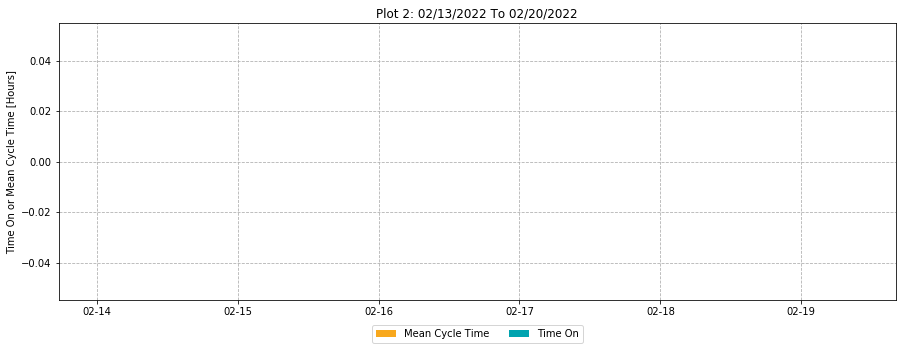

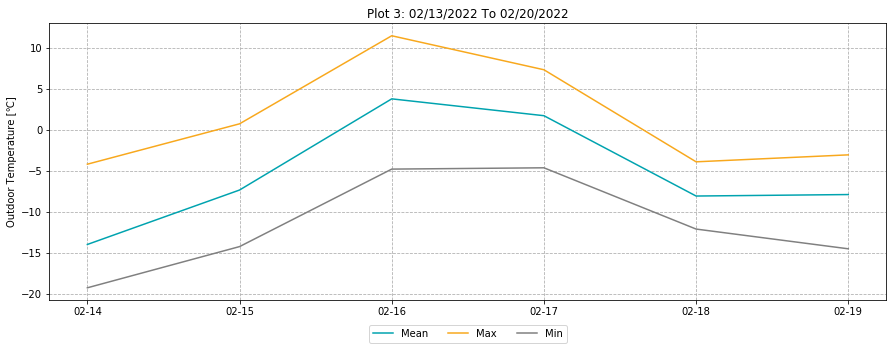

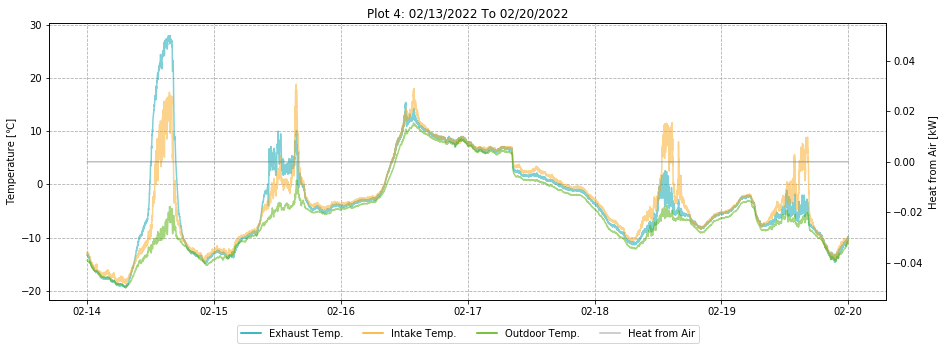

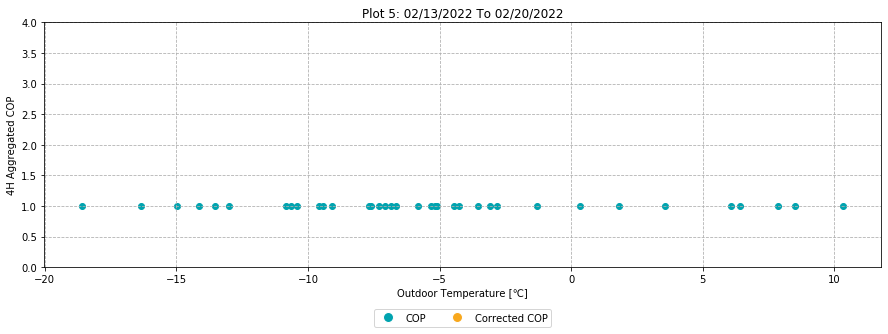

...

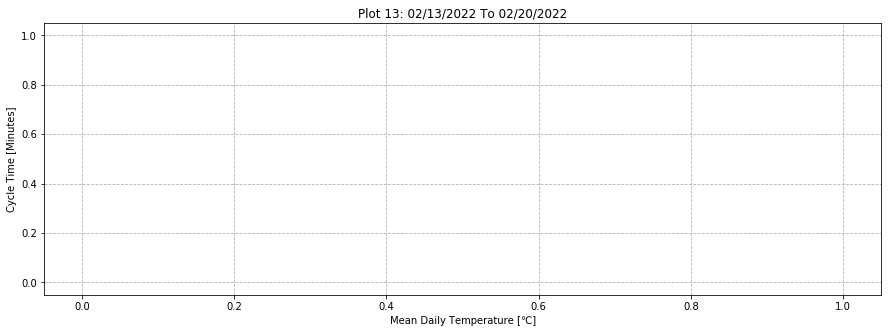

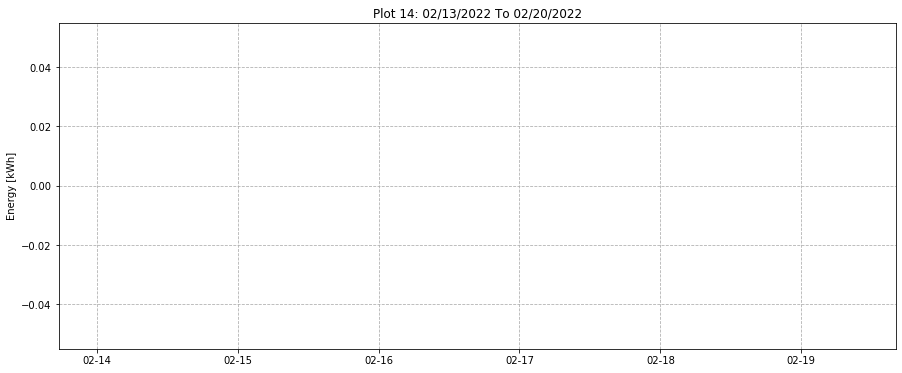

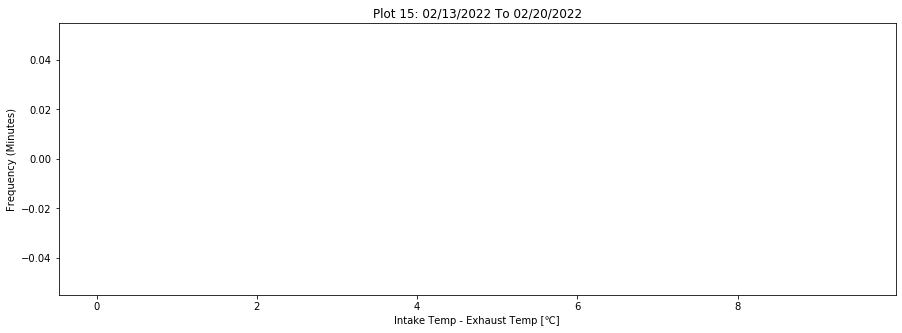

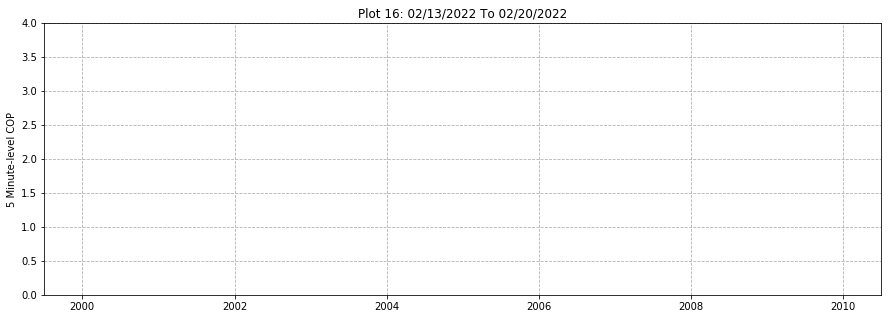

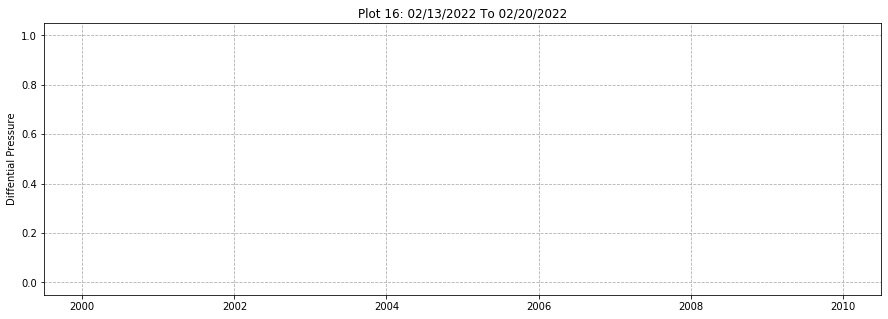

In [75]:
summary_plots(start_dates[20],end_dates[20])

In [137]:
#summary_plots(start_dates[21],end_dates[21])

In [138]:
#summary_plots(start_dates[22],end_dates[22])

In [139]:
#summary_plots(start_dates[23],end_dates[23])

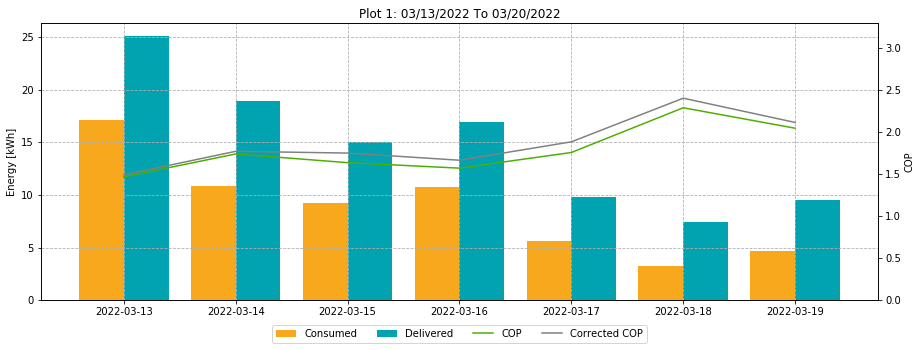

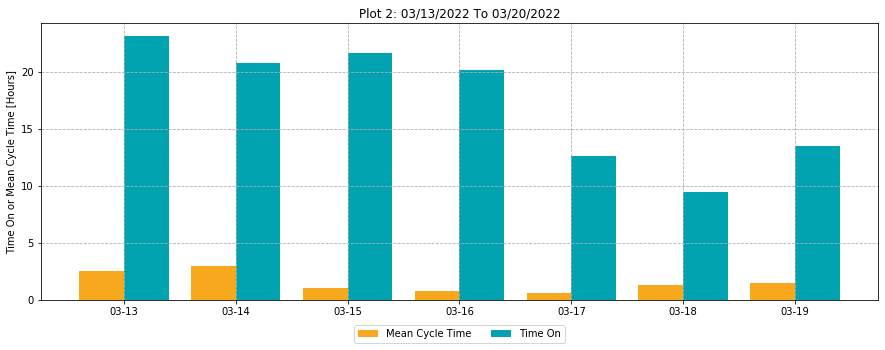

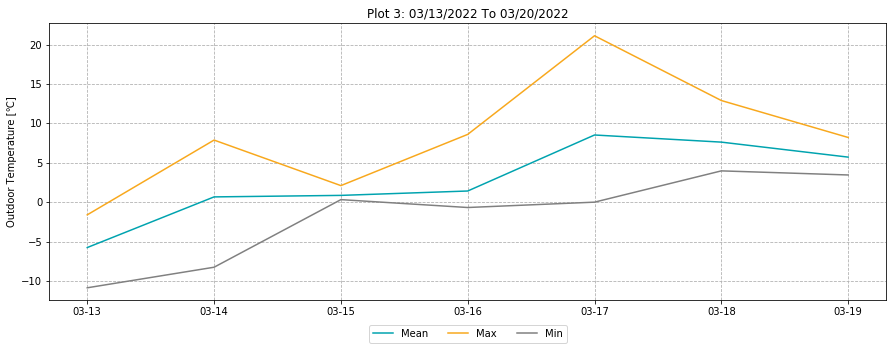

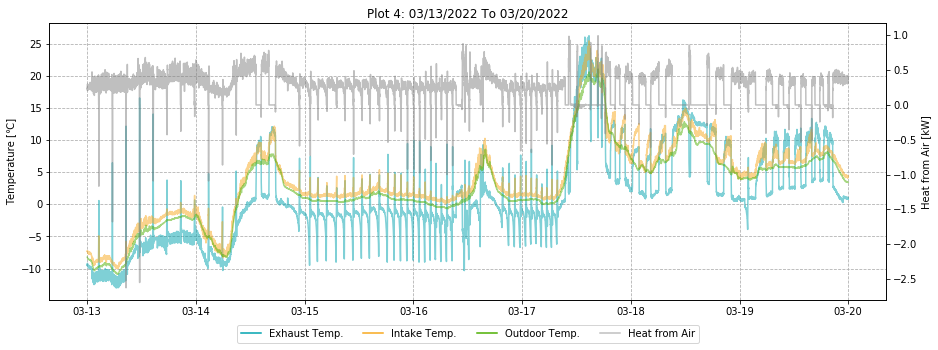

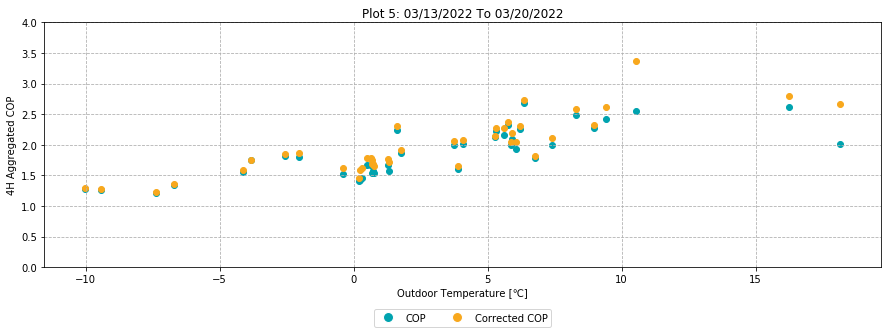

...

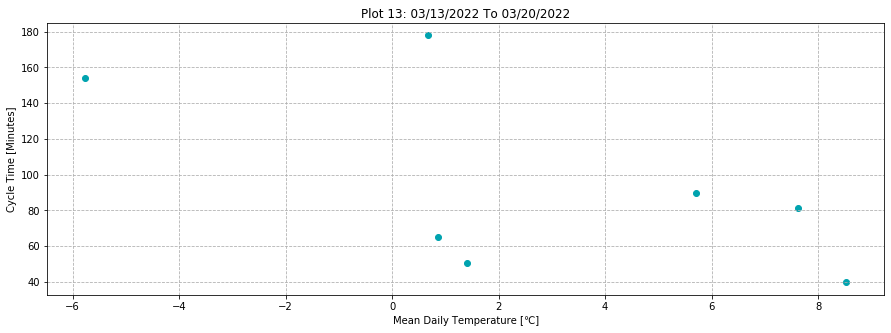

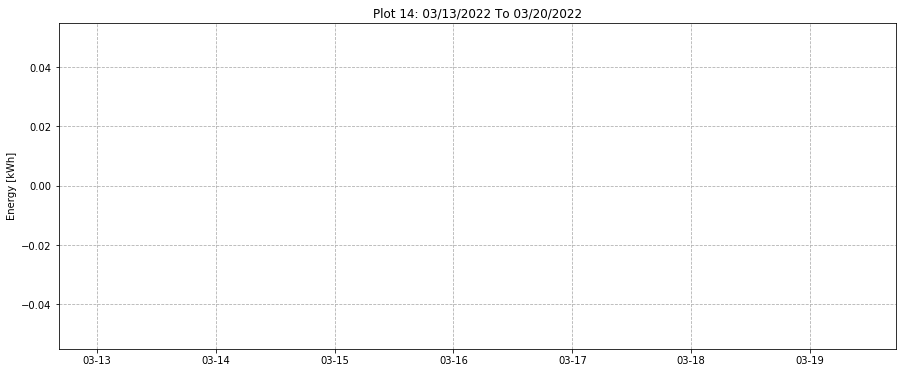

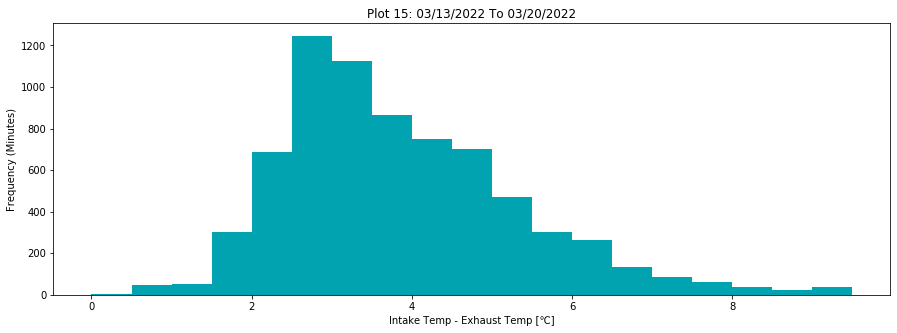

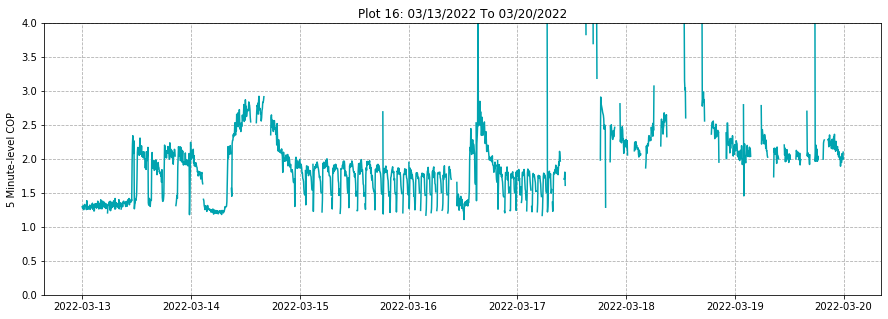

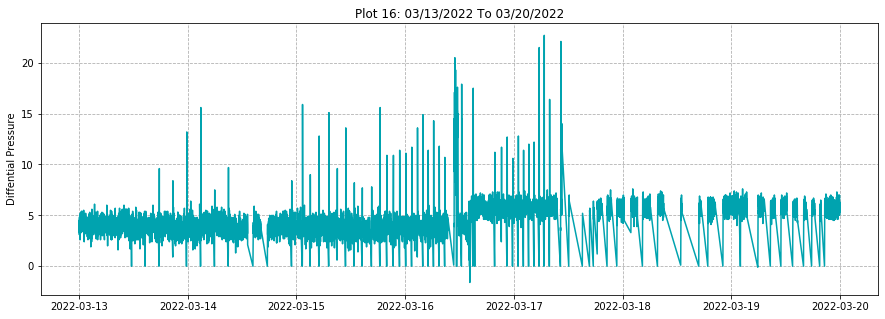

In [79]:
summary_plots(start_dates[24],end_dates[24])

In [140]:
#summary_plots(start_dates[25],end_dates[25])

In [141]:
#summary_plots(start_dates[26],end_dates[26])

In [142]:
#summary_plots(start_dates[27],end_dates[27])

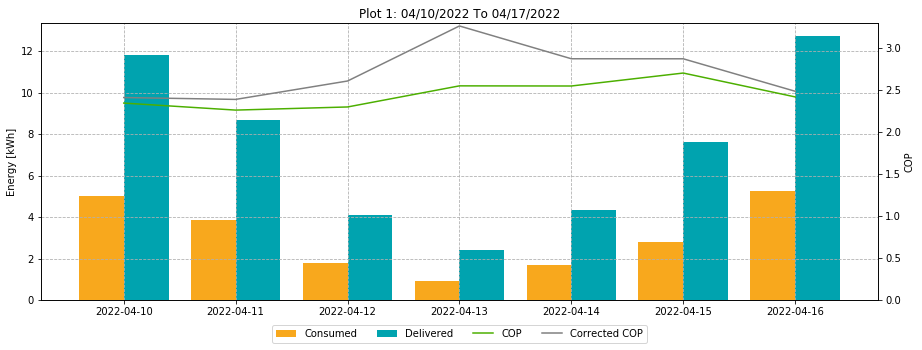

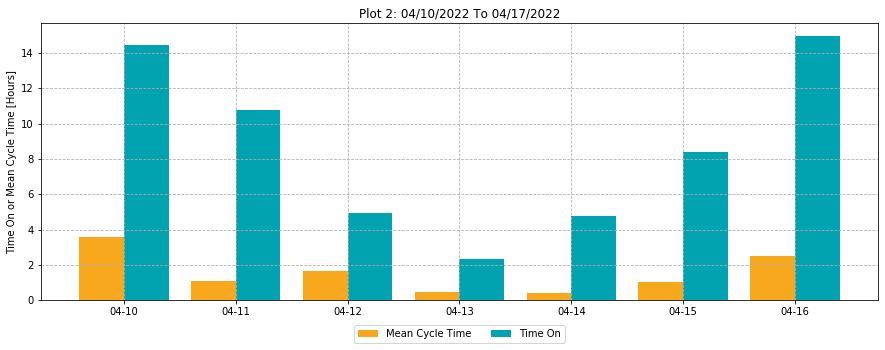

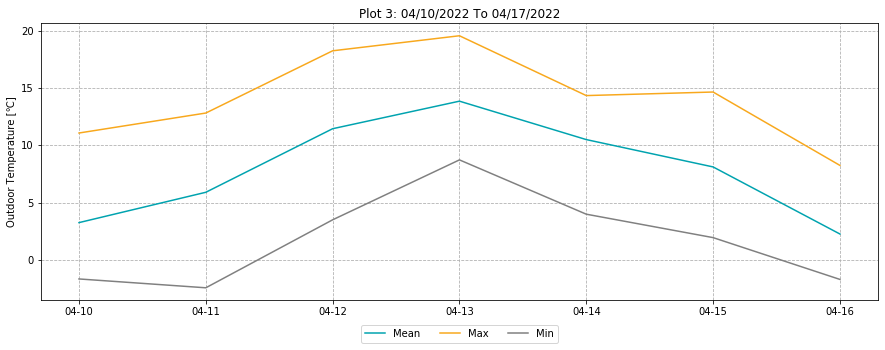

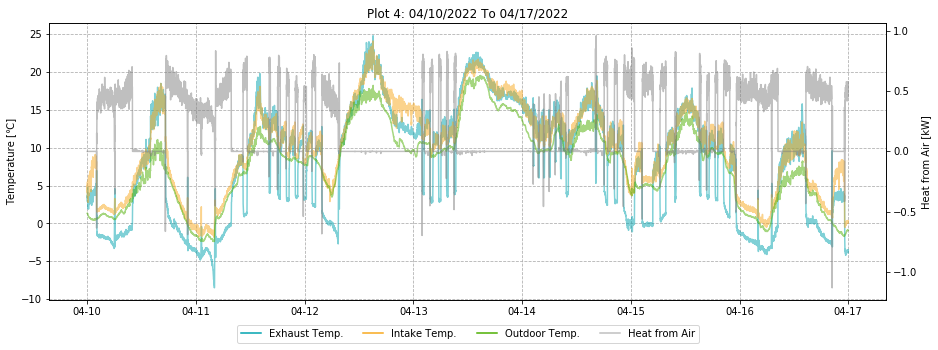

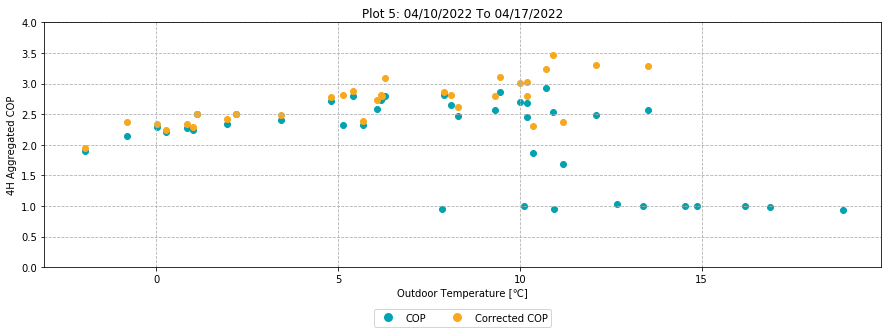

...

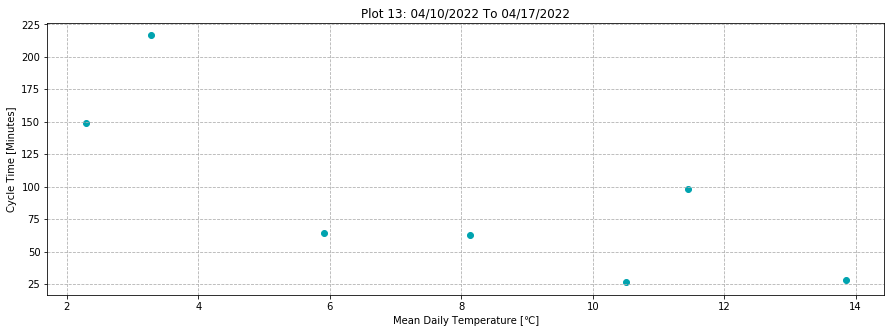

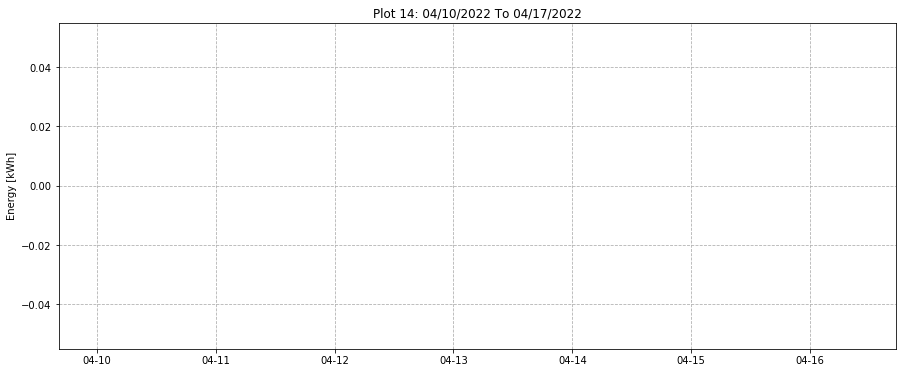

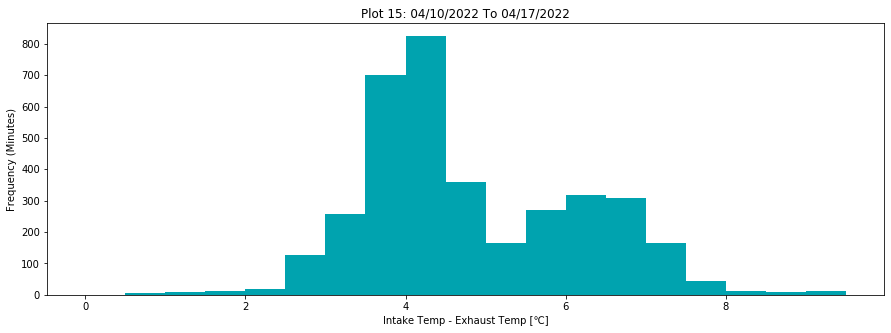

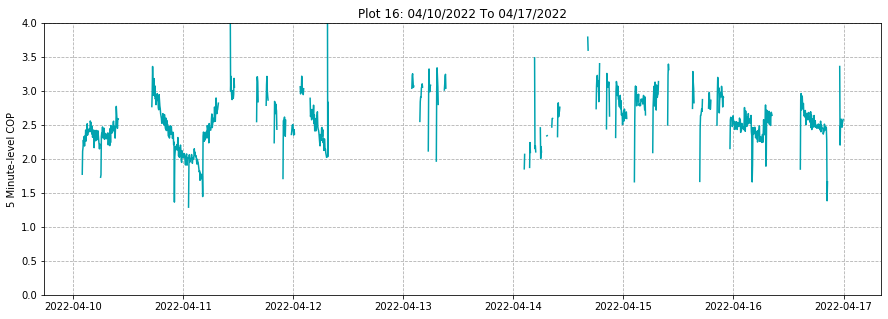

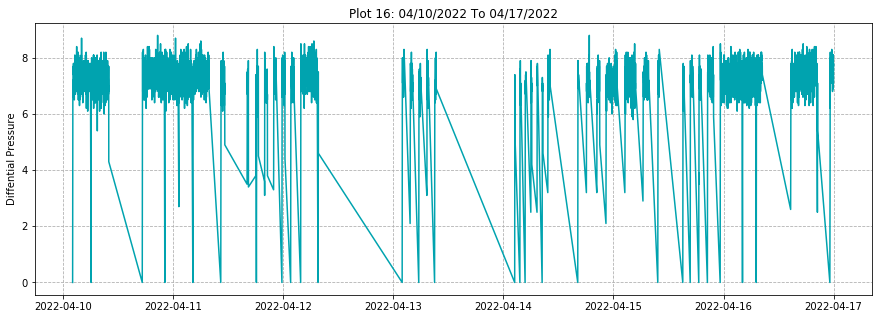

In [83]:
summary_plots(start_dates[28],end_dates[28])

In [143]:
#summary_plots(start_dates[29],end_dates[29])

In [144]:
#summary_plots(start_dates[30],end_dates[30])

In [145]:
#summary_plots(start_dates[31],end_dates[31])

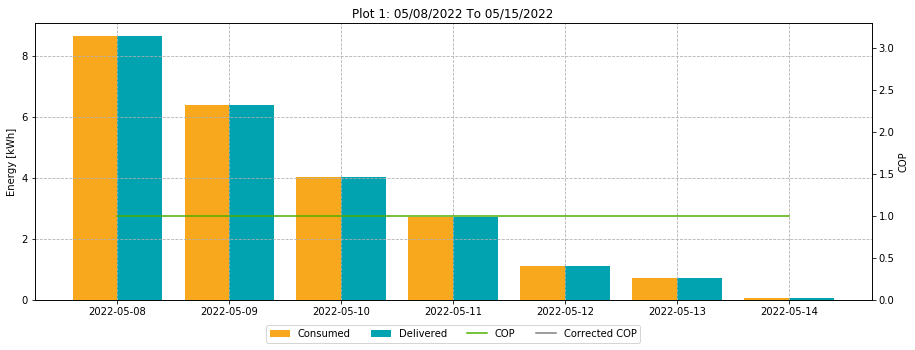

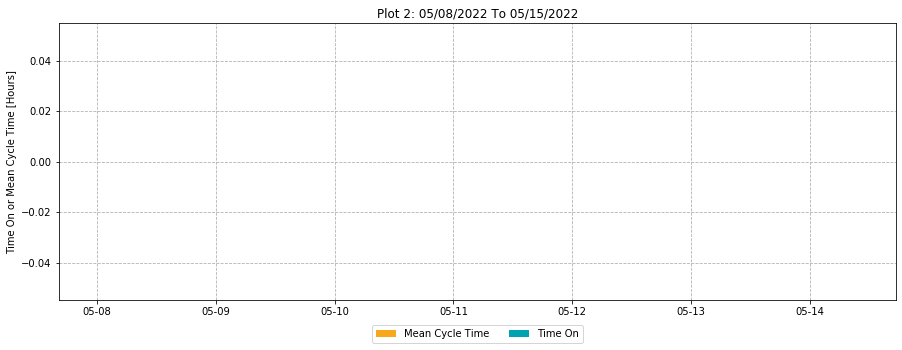

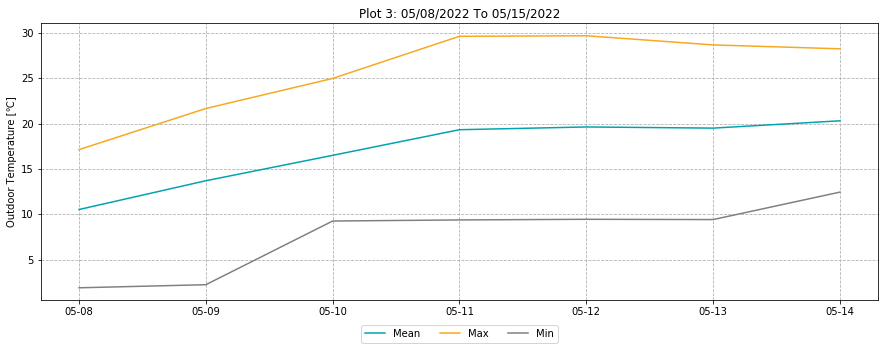

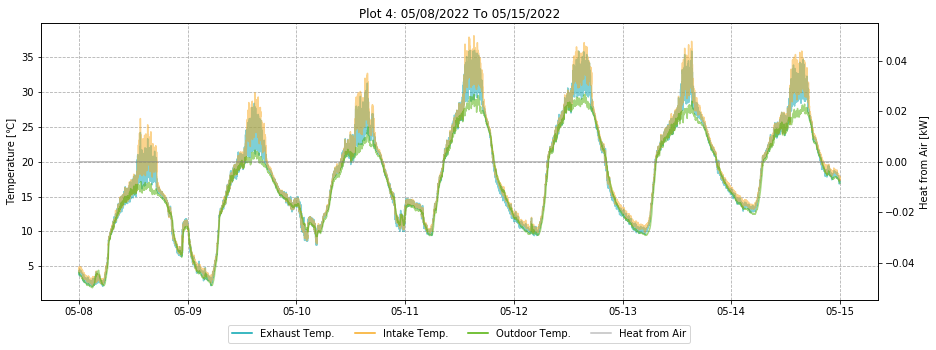

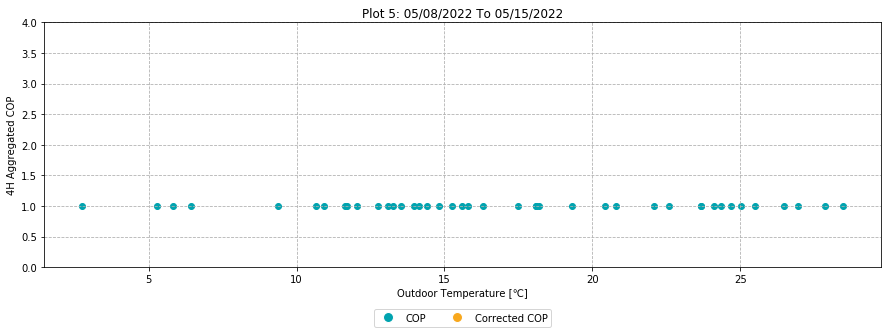

...

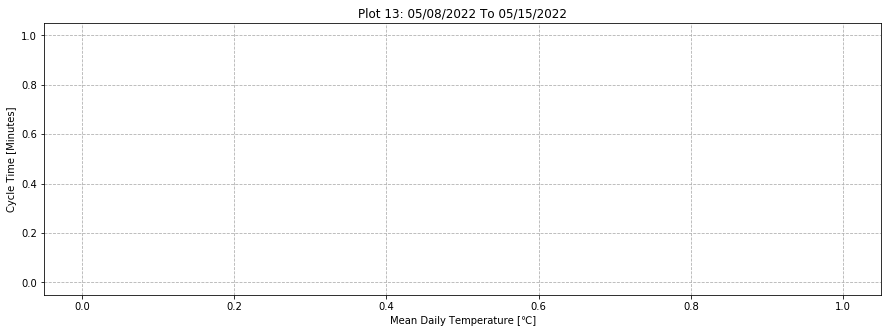

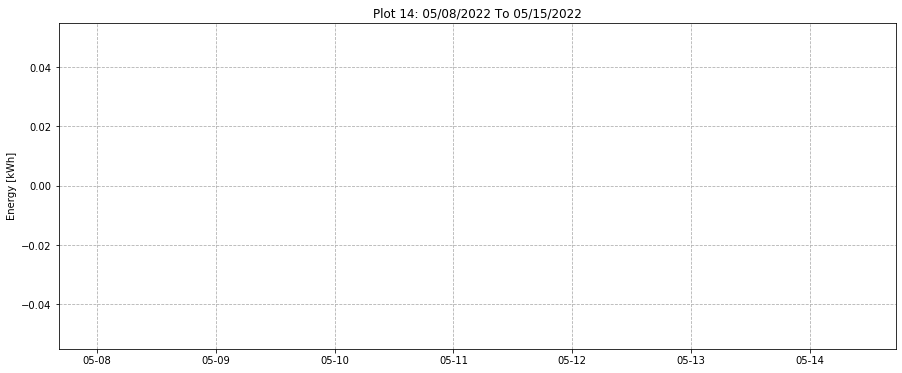

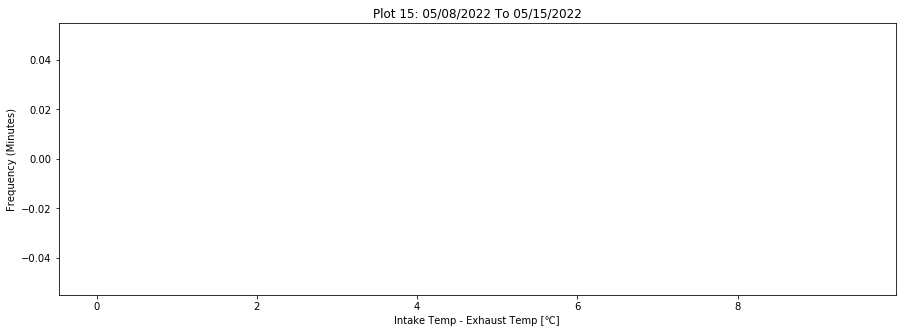

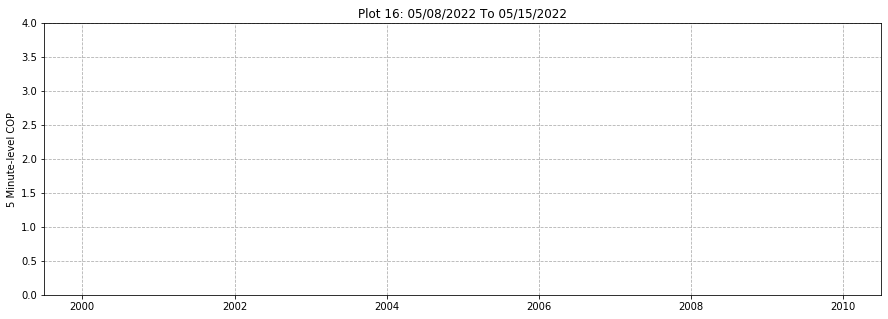

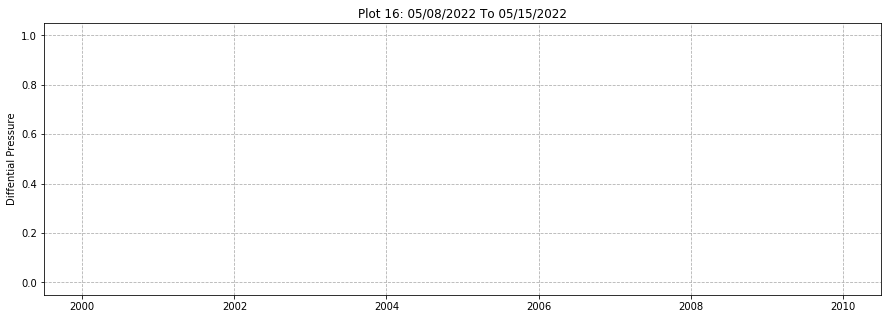

In [87]:
summary_plots(start_dates[32],end_dates[32])

In [146]:
#summary_plots(start_dates[33],end_dates[33])

In [147]:
#summary_plots(start_dates[34],end_dates[34])

# 8 COP and Energy Savings in Different Canadian Cities

Now going to look at COP and energy savings in Canadian cities for the past 10 years. Define some start dates and end dates for each year.

In [90]:
start_dates = [
    datetime.datetime.strptime('09/01/2012', '%m/%d/%Y'),
    datetime.datetime.strptime('09/01/2013', '%m/%d/%Y'),
    datetime.datetime.strptime('09/01/2014', '%m/%d/%Y'),
    datetime.datetime.strptime('09/01/2015', '%m/%d/%Y'),
    datetime.datetime.strptime('09/01/2016', '%m/%d/%Y'),
    datetime.datetime.strptime('09/01/2017', '%m/%d/%Y'),
    datetime.datetime.strptime('09/01/2018', '%m/%d/%Y'),
    datetime.datetime.strptime('09/01/2019', '%m/%d/%Y'),
    datetime.datetime.strptime('09/01/2020', '%m/%d/%Y'),
    datetime.datetime.strptime('09/01/2021', '%m/%d/%Y'),
]

end_dates = [
    datetime.datetime.strptime('05/30/2013', '%m/%d/%Y'),
    datetime.datetime.strptime('05/30/2014', '%m/%d/%Y'),
    datetime.datetime.strptime('05/30/2015', '%m/%d/%Y'),
    datetime.datetime.strptime('05/30/2016', '%m/%d/%Y'),
    datetime.datetime.strptime('05/30/2017', '%m/%d/%Y'),
    datetime.datetime.strptime('05/30/2018', '%m/%d/%Y'),
    datetime.datetime.strptime('05/30/2019', '%m/%d/%Y'),
    datetime.datetime.strptime('05/30/2020', '%m/%d/%Y'),
    datetime.datetime.strptime('05/30/2021', '%m/%d/%Y'),
    datetime.datetime.strptime('05/30/2022', '%m/%d/%Y'),
]

labels = [
    '2012/2013',
    '2013/2014',
    '2014/2015',
    '2015/2016',
    '2016/2017',
    '2017/2018',
    '2018/2019',
    '2019/2020',
    '2020/2021',
    '2021/2022',   
]

In [91]:
# Import Data
city_data = {
    'Toronto': 'Toronto_10_yr.csv',
    'Vancouver': 'Vancouver_10_yr.csv',
    'Quebec' : 'Quebec_10_yr.csv',
    'Edmonton' : 'Edmonton_10_yr.csv',
    'Halifax':'Halifax_10_yr.csv',
    'Ottawa':'Ottawa_10_yr.csv'
}

cities = {}

for key in city_data:
    df = pd.read_csv(city_data[key],parse_dates = ['date_time_local'])
    df.index = df.date_time_local
    del df['date_time_local']
    cities[key] = df
    print(key)

Toronto
Vancouver
Quebec
Edmonton
Halifax
Ottawa


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


,Year,Toronto_BB_kWh,Toronto_HP_kWh,Toronto_COP,Vancouver_BB_kWh,Vancouver_HP_kWh,Vancouver_COP,Quebec_BB_kWh,Quebec_HP_kWh,Quebec_COP,Edmonton_BB_kWh,Edmonton_HP_kWh,Edmonton_COP,Halifax_BB_kWh,Halifax_HP_kWh,Halifax_COP,Ottawa_BB_kWh,Ottawa_HP_kWh,Ottawa_COP
0,2012/2013,3203.382359,1823.039004,1.757166,2477.322197,1085.416257,2.282371,3982.561525,2722.166964,1.463011,4503.193550,3387.054029,1.329531,3279.378097,1842.395456,1.779953,3770.546624,2534.024470,1.487968
1,2013/2014,3691.907992,2523.431814,1.463050,2583.023433,1177.245159,2.194125,4456.140976,3378.868333,1.318826,4600.133281,3542.199293,1.298666,3512.796342,2065.272281,1.700888,4147.024918,3073.005263,1.349501
2,2014/2015,3513.177152,2370.813686,1.481844,2236.957529,973.109506,2.298773,4364.179560,3290.091377,1.326462,4063.989117,2845.621981,1.428155,3467.973527,2108.823402,1.644506,4030.751077,3003.790098,1.341888
3,2015/2016,2977.181335,1637.601334,1.818014,2315.851235,998.965586,2.318249,3923.814038,2583.944034,1.518537,3770.897341,2435.299026,1.548433,3150.467437,1686.590229,1.867951,3547.872818,2279.223319,1.556615
4,2016/2017,2980.176329,1670.711258,1.783777,2619.827446,1217.872641,2.151151,4036.350038,2733.547812,1.476598,4270.496400,3016.237402,1.415836,3298.088374,1844.496776,1.788069,3646.317636,2376.058632,1.534608
5,2017/2018,3286.051880,2055.295245,1.598822,2503.677419,1120.615786,2.234198,4155.117921,2978.243754,1.395157,4417.785995,3319.675027,1.330789,3128.772454,1741.100379,1.797009,3787.709950,2645.669662,1.431664
6,2018/2019,3467.702741,2096.586033,1.653976,2538.900019,1142.687816,2.221867,4524.923427,3330.171205,1.358766,4522.211940,3229.180907,1.400421,3524.084636,2036.476194,1.730482,4145.282695,2947.039793,1.406592
7,2019/2020,3206.223082,1780.194592,1.801052,2525.428080,1116.497050,2.261921,4182.724865,2835.145277,1.475312,4465.425495,3210.806272,1.390749,3354.881910,1827.931359,1.835343,3781.043001,2429.543610,1.556277
8,2020/2021,3092.643222,1742.839453,1.774485,2452.511439,1074.542920,2.282376,3936.730106,2626.397792,1.498909,4213.123668,2895.645580,1.454986,3063.960787,1596.089423,1.919667,3622.807456,2368.679744,1.529463
9,2021/2022,3136.807624,1897.341136,1.653265,2647.886656,1210.304541,2.187785,4160.637623,2997.530633,1.388022,4372.279358,3103.371250,1.408881,3129.114348,1734.579668,1.803961,3784.965779,2677.847441,1.413436


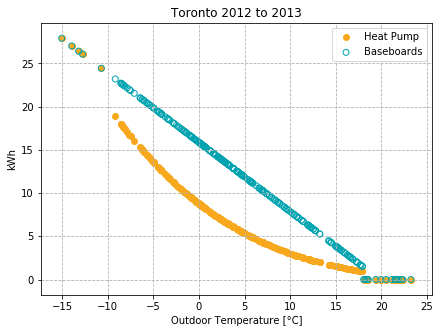

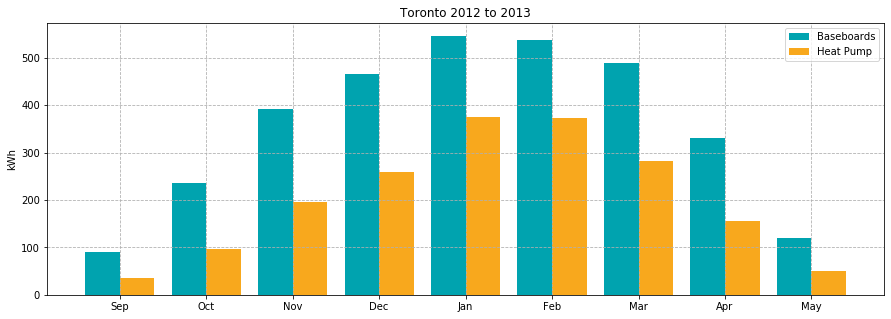

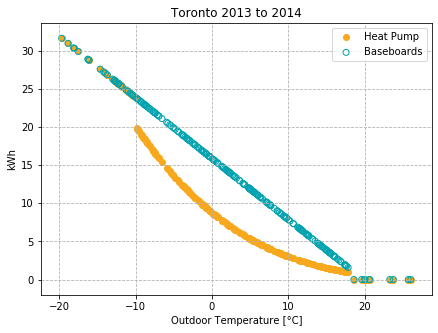

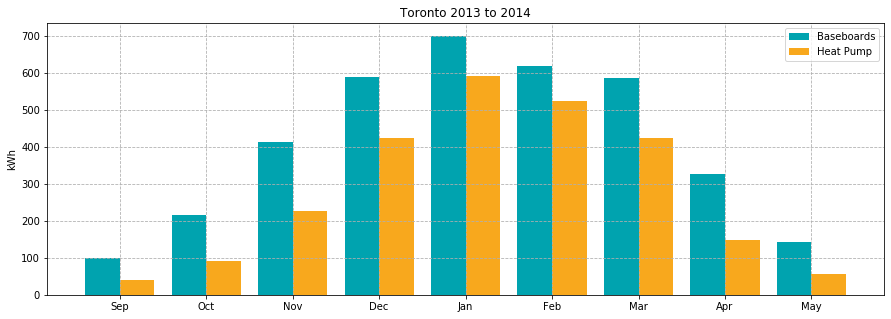

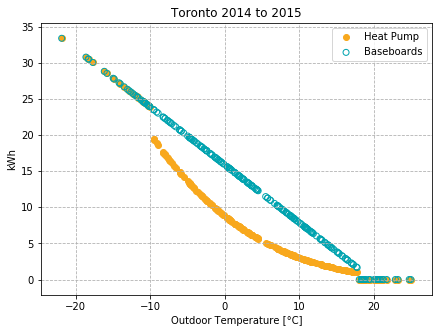

...

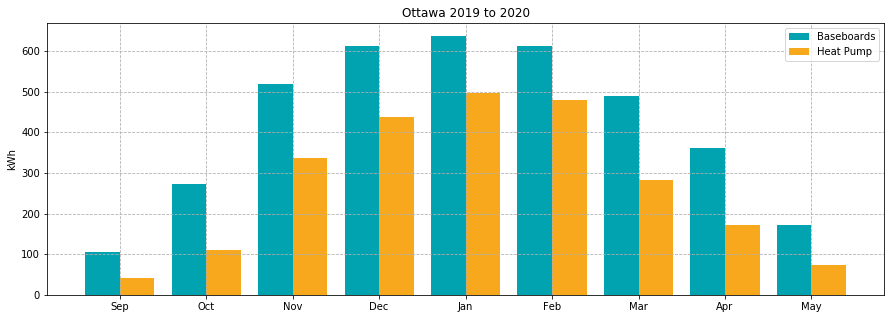

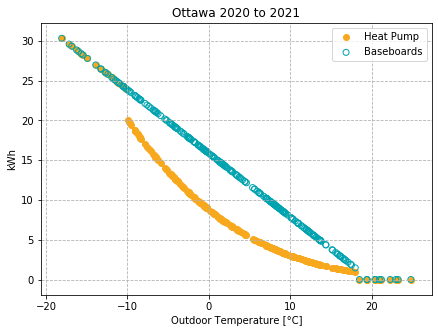

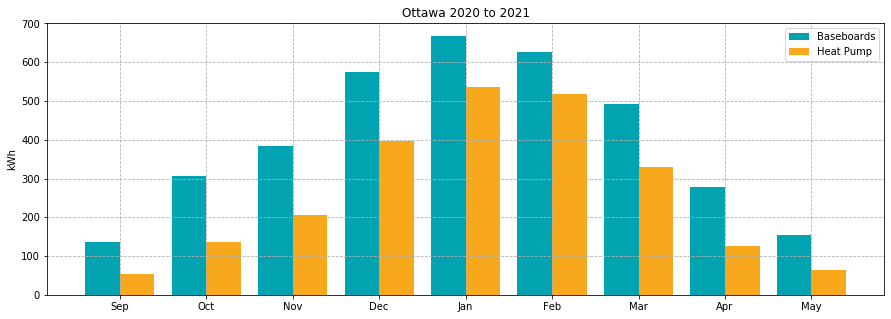

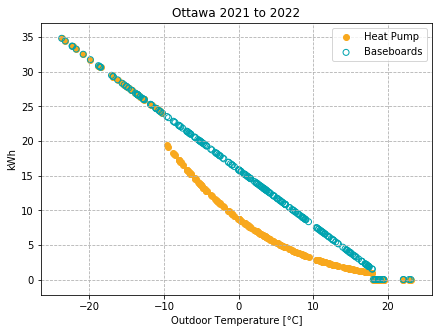

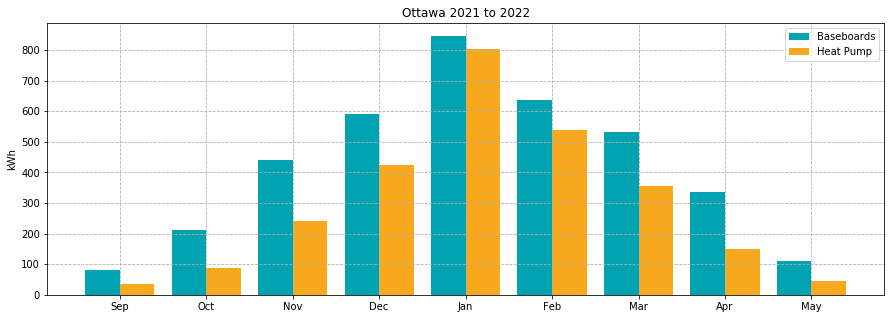

In [92]:
# Apply regression models to weather data from each city
results_dict = {
    'Year':labels
}

for city in cities:
    BB_list = []
    HP_list = []
    COP_list = []
    for strt, end in zip(start_dates,end_dates):
        df = cities[city].resample('1D').mean()
        df = df.loc[(df.index > strt)&(df.index < end)]
        df['HP_kWh'] = [model_OD(x, 'HP') for x in df.temperature]
        df['BB_kWh'] = [model_OD(x, 'BB') for x in df.temperature]
        BB_list.append(df.BB_kWh.sum())
        HP_list.append(df.HP_kWh.sum())
        COP_list.append(df.BB_kWh.sum()/df.HP_kWh.sum())
        # Visualize
        # Check that the actual data is lining up with models 
        plt.figure(figsize = (7,5))
        plt.scatter(df.temperature,df.HP_kWh,color = step_gold, label = 'Heat Pump')
        plt.scatter(df.temperature,df.BB_kWh,edgecolors = step_blue, facecolors = 'none', label = 'Baseboards')
        plt.legend()
        plt.grid(ls='--')
        plt.ylabel('kWh')
        plt.xlabel('Outdoor Temperature [°C]')
        plt.title(city + ' ' + str(strt)[:-15] + ' to ' + str(end)[:-15])      
        
        # Check monthly totals
        plt.figure(figsize = (15,5))
        plt.bar(np.arange(0,9,1),
                df.resample('M').sum()['BB_kWh'],
                width = -0.4,
                label = 'Baseboards', 
                color = step_blue, 
                align = 'edge')
        plt.bar(np.arange(0,9,1),
                df.resample('M').sum()['HP_kWh'],
                width = 0.4, 
                label = 'Heat Pump', 
                color = step_gold,
                align = 'edge')
        plt.xticks(ticks=[0,1,2,3,4,5,6,7,8], labels=['Sep','Oct','Nov','Dec','Jan','Feb','Mar','Apr','May'])
        plt.legend()
        plt.grid(ls='--')
        plt.ylabel('kWh')
        plt.title(city + ' ' + str(strt)[:-15] + ' to ' + str(end)[:-15])        
    results_dict[city + '_BB_kWh'] = BB_list
    results_dict[city + '_HP_kWh'] = HP_list
    results_dict[city + '_COP'] = COP_list
results_df = pd.DataFrame(results_dict)
results_df

In [93]:
COPs = []
Energy_Savings = []

for key in cities:
    COPs.append(results_df[key + '_BB_kWh'].sum()/results_df[key + '_HP_kWh'].sum())

for COP in COPs:
    Energy_Savings.append(1-1/COP)
    
Cities_list = []
for city in cities:
    Cities_list.append(city)

COP_dict = {
    'Cities': Cities_list,
    'Average COP': COPs,
    'Average Energy Savings (Perc)':Energy_Savings
}

COP_df = pd.DataFrame(COP_dict)
COP_df

,Cities,Average COP,Average Energy Savings (Perc)
0,Toronto,1.661164,0.398013
1,Vancouver,2.239886,0.553549
2,Quebec,1.415492,0.293532
3,Edmonton,1.394204,0.282745
4,Halifax,1.780456,0.438346
5,Ottawa,1.452990,0.311764
